# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

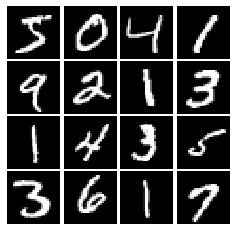

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(alpha*x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform([batch_size, dim], minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [10]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256, activation = tf.keras.layers.LeakyReLU(alpha=0.01), use_bias=True, input_shape=(784,)),      
        tf.keras.layers.Dense(256, use_bias=True,  activation= tf.keras.layers.LeakyReLU(alpha=0.01)),
        tf.keras.layers.Dense(1, use_bias=True, activation='linear'),

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [11]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [14]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, activation = 'relu', use_bias=True, input_shape=(noise_dim,)),      
         tf.keras.layers.Dense(1024, use_bias=True,  activation= 'relu'),
         tf.keras.layers.Dense(784, use_bias=True, activation='tanh'),

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [15]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [16]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    labels_real = tf.ones_like(logits_real)
    labels_fake = tf.zeros_like(logits_fake)
    loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=labels_real, logits=logits_real))
    loss += tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=labels_fake, logits=logits_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    labels_fake = tf.ones_like(logits_fake)
    loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=labels_fake, logits=logits_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [18]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 6.02597e-17


In [19]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [26]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate = learning_rate, beta_1 = beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate = learning_rate, beta_1 = beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [27]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.073, G:0.7


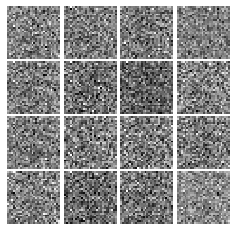

Epoch: 0, Iter: 20, D: 0.5656, G:1.038


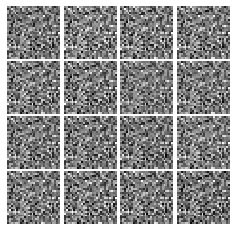

Epoch: 0, Iter: 40, D: 0.4348, G:1.108


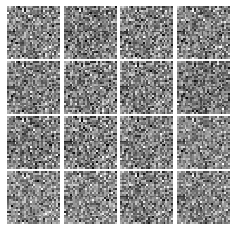

Epoch: 0, Iter: 60, D: 0.1521, G:2.912


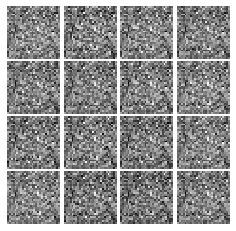

Epoch: 0, Iter: 80, D: 2.385, G:1.019


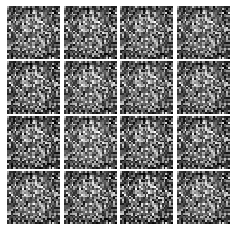

Epoch: 0, Iter: 100, D: 0.3014, G:2.252


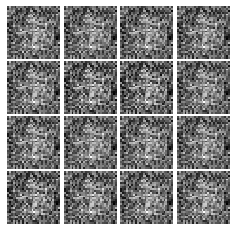

Epoch: 0, Iter: 120, D: 1.354, G:0.859


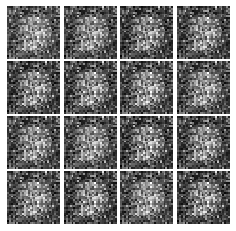

Epoch: 0, Iter: 140, D: 1.86, G:1.198


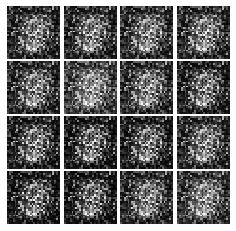

Epoch: 0, Iter: 160, D: 1.335, G:0.8393


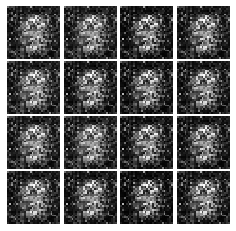

Epoch: 0, Iter: 180, D: 2.005, G:0.8056


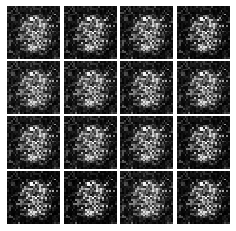

Epoch: 0, Iter: 200, D: 1.343, G:1.675


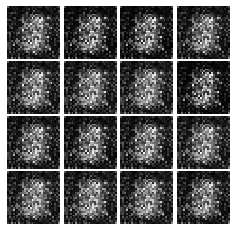

Epoch: 0, Iter: 220, D: 1.516, G:1.303


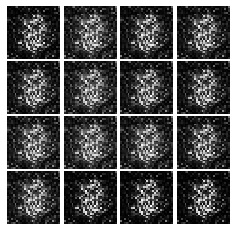

Epoch: 0, Iter: 240, D: 1.933, G:2.166


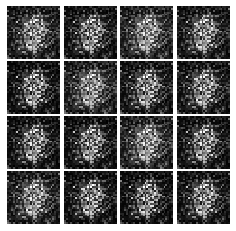

Epoch: 0, Iter: 260, D: 1.288, G:0.9299


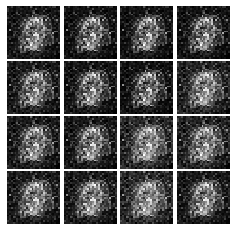

Epoch: 0, Iter: 280, D: 1.813, G:2.391


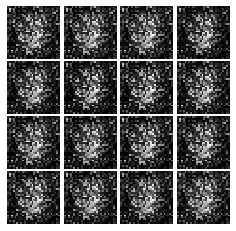

Epoch: 0, Iter: 300, D: 1.412, G:1.269


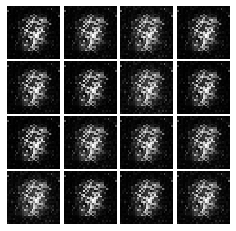

Epoch: 0, Iter: 320, D: 1.265, G:1.596


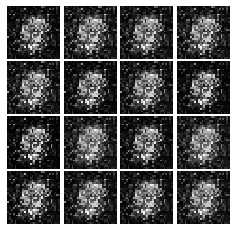

Epoch: 0, Iter: 340, D: 1.551, G:0.6612


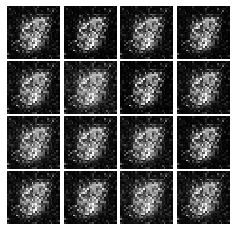

Epoch: 0, Iter: 360, D: 0.8324, G:2.001


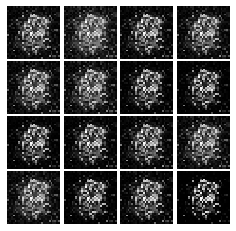

Epoch: 0, Iter: 380, D: 1.502, G:2.112


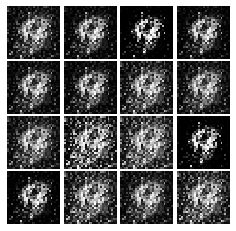

Epoch: 0, Iter: 400, D: 1.43, G:1.069


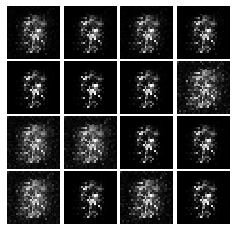

Epoch: 0, Iter: 420, D: 1.292, G:1.261


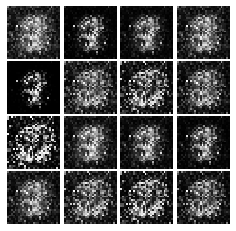

Epoch: 0, Iter: 440, D: 1.098, G:1.256


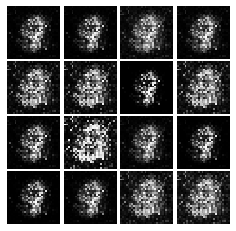

Epoch: 0, Iter: 460, D: 1.019, G:1.397


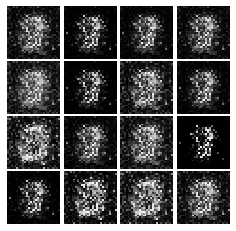

Epoch: 1, Iter: 480, D: 1.449, G:1.162


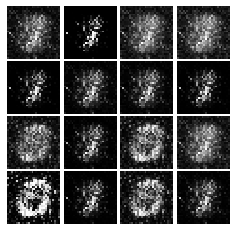

Epoch: 1, Iter: 500, D: 0.985, G:1.089


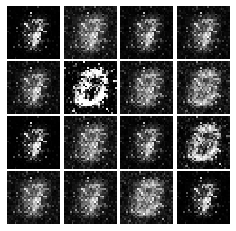

Epoch: 1, Iter: 520, D: 1.027, G:0.9973


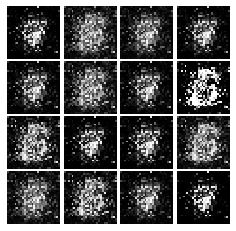

Epoch: 1, Iter: 540, D: 1.55, G:1.138


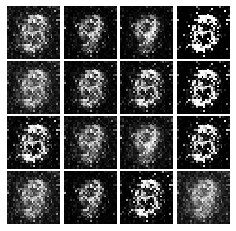

Epoch: 1, Iter: 560, D: 1.802, G:0.5348


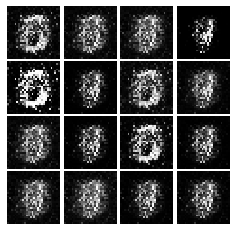

Epoch: 1, Iter: 580, D: 1.046, G:2.974


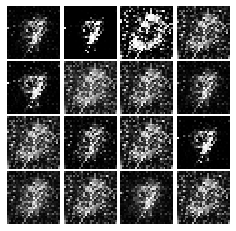

Epoch: 1, Iter: 600, D: 1.204, G:1.148


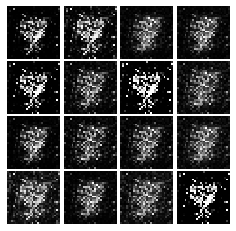

Epoch: 1, Iter: 620, D: 1.291, G:1.532


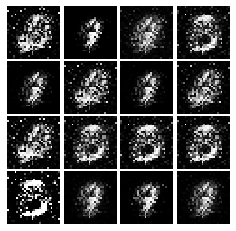

Epoch: 1, Iter: 640, D: 1.202, G:1.422


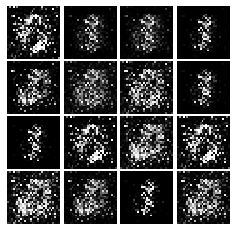

Epoch: 1, Iter: 660, D: 1.074, G:1.441


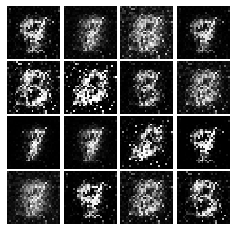

Epoch: 1, Iter: 680, D: 1.21, G:1.409


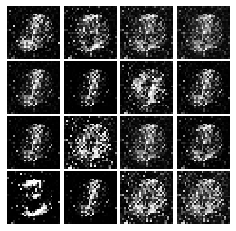

Epoch: 1, Iter: 700, D: 1.48, G:1.29


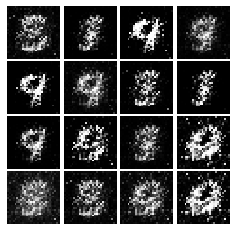

Epoch: 1, Iter: 720, D: 1.441, G:1.11


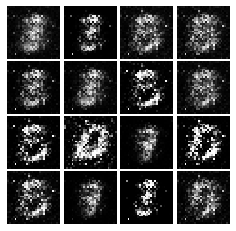

Epoch: 1, Iter: 740, D: 1.25, G:2.043


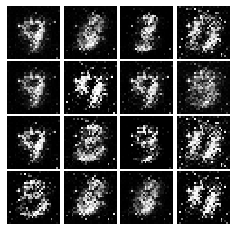

Epoch: 1, Iter: 760, D: 1.197, G:0.7939


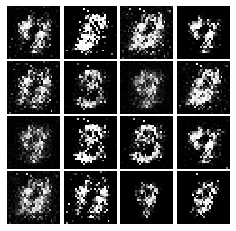

Epoch: 1, Iter: 780, D: 1.596, G:0.8858


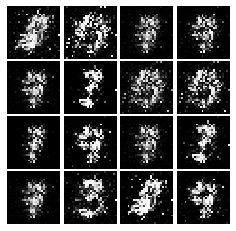

Epoch: 1, Iter: 800, D: 1.312, G:0.8627


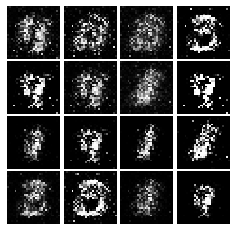

Epoch: 1, Iter: 820, D: 1.102, G:1.205


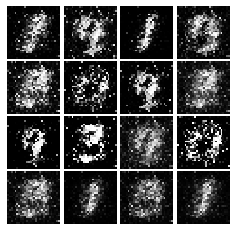

Epoch: 1, Iter: 840, D: 1.152, G:1.211


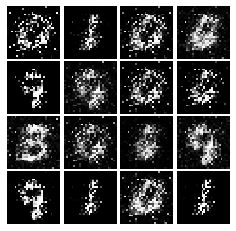

Epoch: 1, Iter: 860, D: 1.253, G:2.455


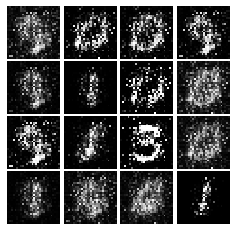

Epoch: 1, Iter: 880, D: 1.304, G:1.787


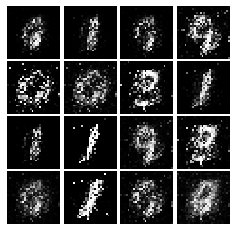

Epoch: 1, Iter: 900, D: 1.102, G:0.7557


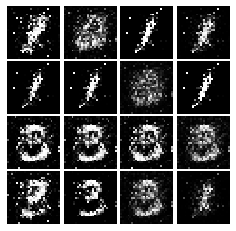

Epoch: 1, Iter: 920, D: 1.295, G:1.011


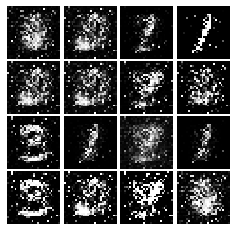

Epoch: 2, Iter: 940, D: 1.369, G:1.445


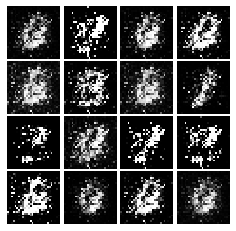

Epoch: 2, Iter: 960, D: 1.136, G:0.9791


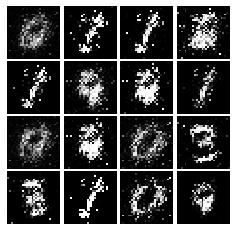

Epoch: 2, Iter: 980, D: 1.33, G:0.981


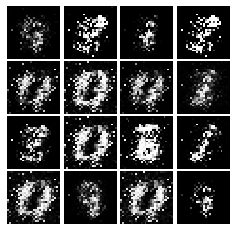

Epoch: 2, Iter: 1000, D: 1.093, G:1.346


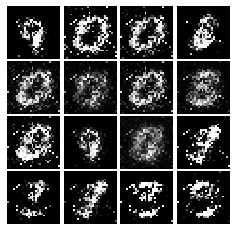

Epoch: 2, Iter: 1020, D: 0.8147, G:1.296


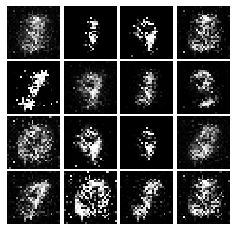

Epoch: 2, Iter: 1040, D: 1.237, G:0.8919


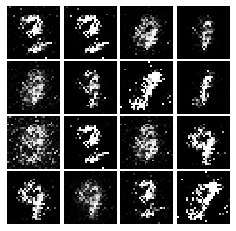

Epoch: 2, Iter: 1060, D: 1.299, G:1.544


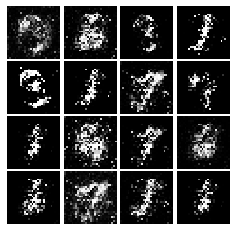

Epoch: 2, Iter: 1080, D: 2.141, G:0.6889


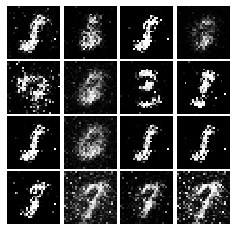

Epoch: 2, Iter: 1100, D: 1.236, G:1.075


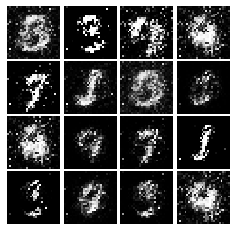

Epoch: 2, Iter: 1120, D: 1.268, G:2.161


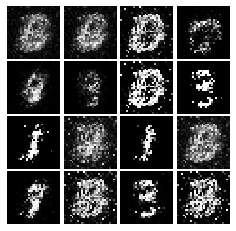

Epoch: 2, Iter: 1140, D: 1.107, G:0.9531


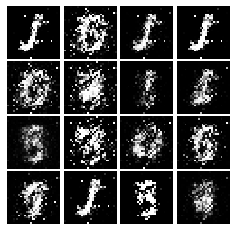

Epoch: 2, Iter: 1160, D: 1.158, G:1.394


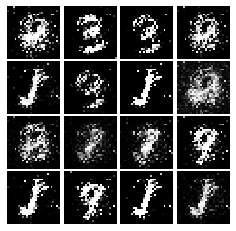

Epoch: 2, Iter: 1180, D: 1.422, G:1.318


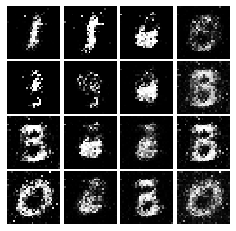

Epoch: 2, Iter: 1200, D: 1.238, G:0.9306


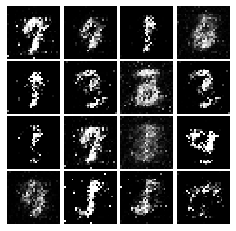

Epoch: 2, Iter: 1220, D: 1.118, G:3.732


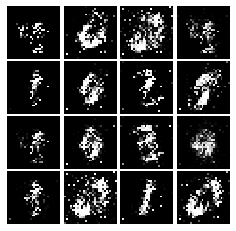

Epoch: 2, Iter: 1240, D: 1.062, G:1.237


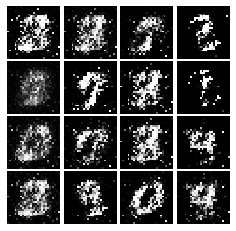

Epoch: 2, Iter: 1260, D: 0.87, G:1.662


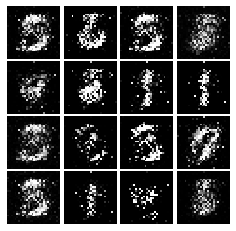

Epoch: 2, Iter: 1280, D: 1.281, G:1.073


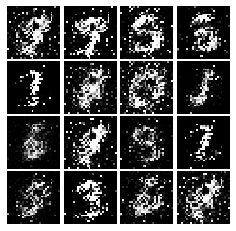

Epoch: 2, Iter: 1300, D: 1.238, G:0.9922


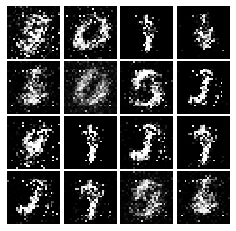

Epoch: 2, Iter: 1320, D: 1.45, G:0.9095


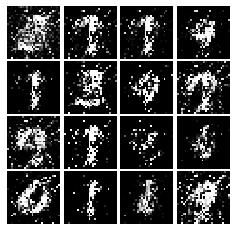

Epoch: 2, Iter: 1340, D: 1.099, G:1.363


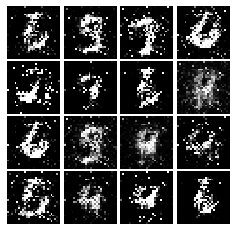

Epoch: 2, Iter: 1360, D: 1.222, G:1.043


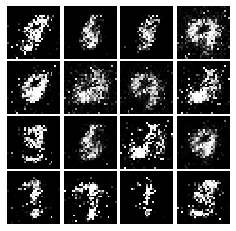

Epoch: 2, Iter: 1380, D: 1.097, G:1.086


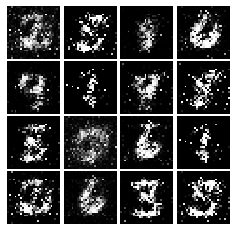

Epoch: 2, Iter: 1400, D: 1.075, G:0.9354


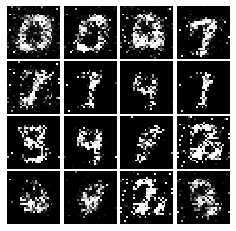

Epoch: 3, Iter: 1420, D: 1.143, G:1.271


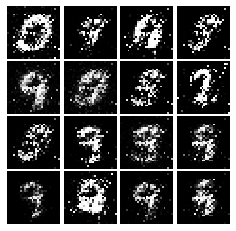

Epoch: 3, Iter: 1440, D: 1.506, G:1.416


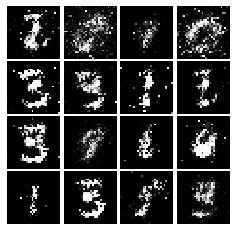

Epoch: 3, Iter: 1460, D: 1.206, G:0.9544


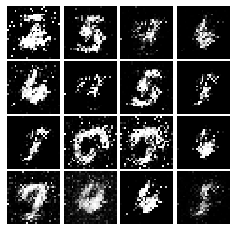

Epoch: 3, Iter: 1480, D: 1.231, G:0.9597


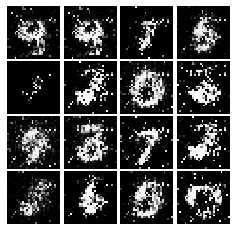

Epoch: 3, Iter: 1500, D: 1.215, G:1.266


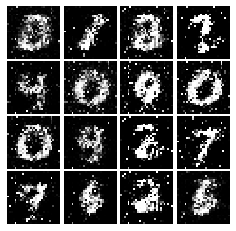

Epoch: 3, Iter: 1520, D: 1.254, G:1.061


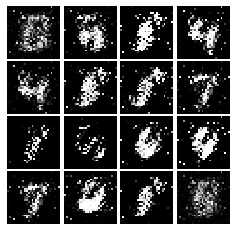

Epoch: 3, Iter: 1540, D: 1.096, G:0.9895


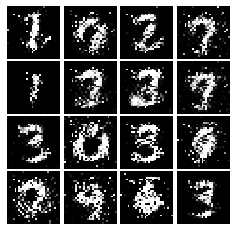

Epoch: 3, Iter: 1560, D: 1.235, G:0.9421


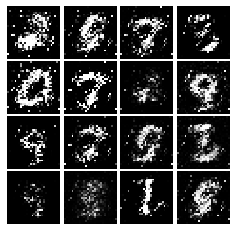

Epoch: 3, Iter: 1580, D: 1.076, G:1.576


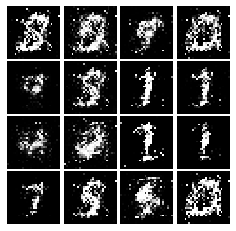

Epoch: 3, Iter: 1600, D: 1.285, G:0.9556


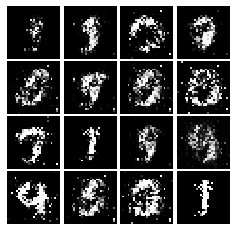

Epoch: 3, Iter: 1620, D: 1.145, G:1.299


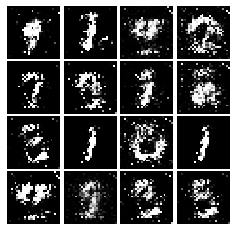

Epoch: 3, Iter: 1640, D: 1.159, G:0.9806


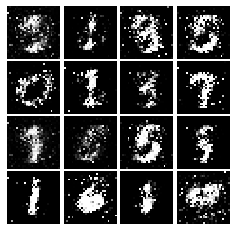

Epoch: 3, Iter: 1660, D: 1.408, G:0.2389


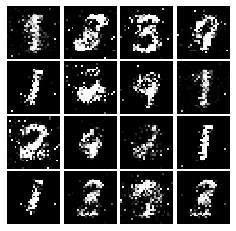

Epoch: 3, Iter: 1680, D: 1.314, G:1.131


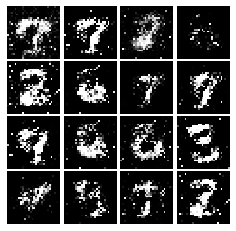

Epoch: 3, Iter: 1700, D: 1.188, G:0.8234


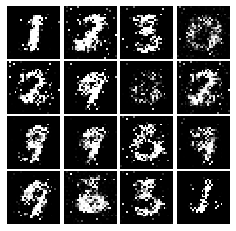

Epoch: 3, Iter: 1720, D: 1.322, G:0.8562


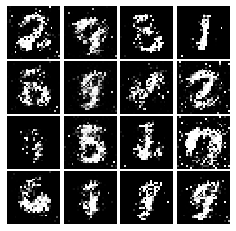

Epoch: 3, Iter: 1740, D: 1.14, G:1.139


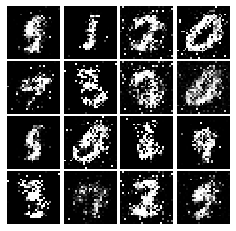

Epoch: 3, Iter: 1760, D: 1.268, G:1.048


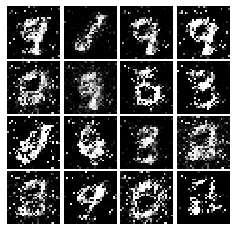

Epoch: 3, Iter: 1780, D: 1.121, G:1.066


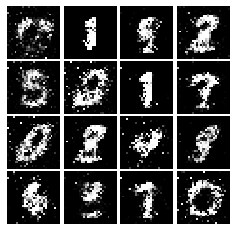

Epoch: 3, Iter: 1800, D: 1.202, G:0.9535


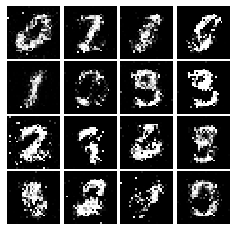

Epoch: 3, Iter: 1820, D: 1.152, G:1.443


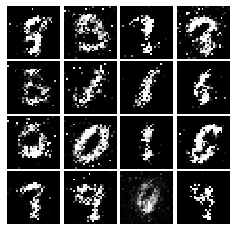

Epoch: 3, Iter: 1840, D: 1.283, G:0.8775


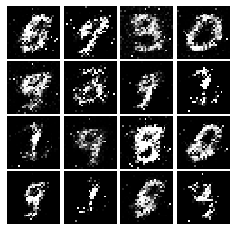

Epoch: 3, Iter: 1860, D: 1.378, G:0.9978


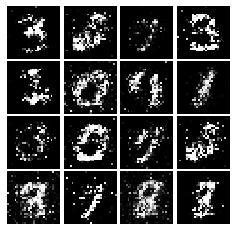

Epoch: 4, Iter: 1880, D: 1.335, G:0.8131


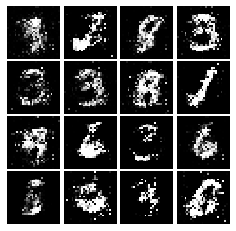

Epoch: 4, Iter: 1900, D: 1.325, G:0.9694


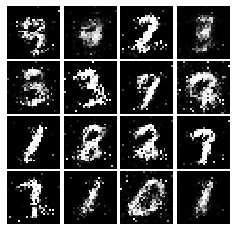

Epoch: 4, Iter: 1920, D: 1.322, G:0.9821


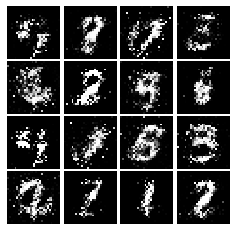

Epoch: 4, Iter: 1940, D: 1.227, G:0.9241


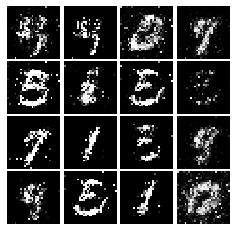

Epoch: 4, Iter: 1960, D: 1.293, G:0.8286


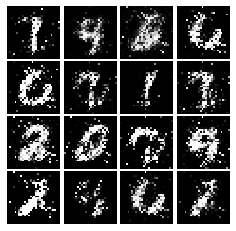

Epoch: 4, Iter: 1980, D: 1.296, G:0.9367


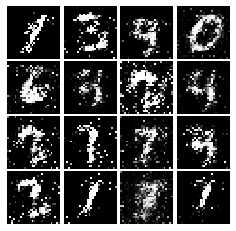

Epoch: 4, Iter: 2000, D: 1.351, G:0.8177


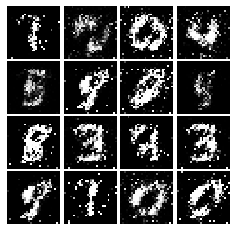

Epoch: 4, Iter: 2020, D: 1.303, G:0.8112


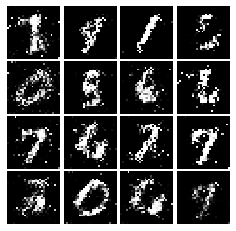

Epoch: 4, Iter: 2040, D: 1.364, G:0.8492


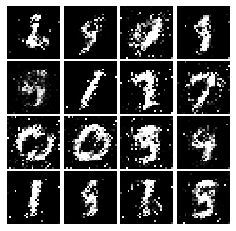

Epoch: 4, Iter: 2060, D: 1.329, G:0.8675


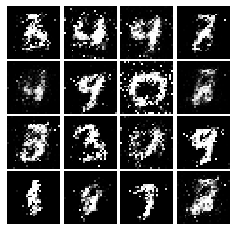

Epoch: 4, Iter: 2080, D: 1.277, G:0.8822


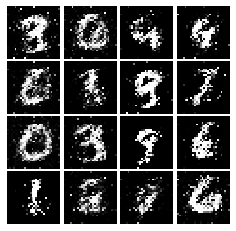

Epoch: 4, Iter: 2100, D: 1.265, G:0.9332


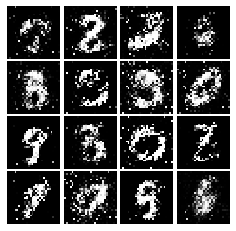

Epoch: 4, Iter: 2120, D: 1.403, G:0.7428


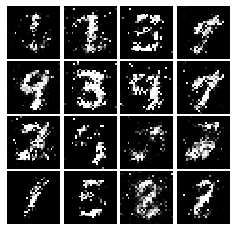

Epoch: 4, Iter: 2140, D: 1.314, G:0.8311


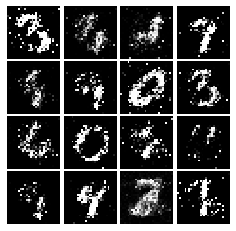

Epoch: 4, Iter: 2160, D: 1.244, G:0.8385


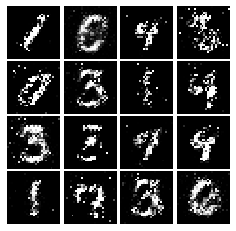

Epoch: 4, Iter: 2180, D: 1.253, G:0.9412


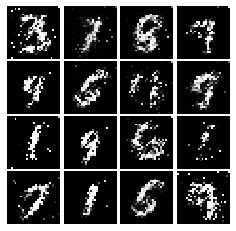

Epoch: 4, Iter: 2200, D: 1.257, G:0.9814


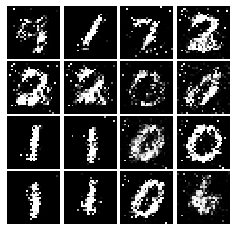

Epoch: 4, Iter: 2220, D: 1.305, G:1.03


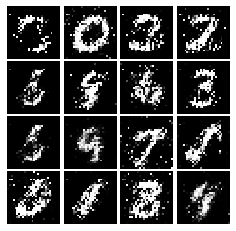

Epoch: 4, Iter: 2240, D: 1.369, G:0.7862


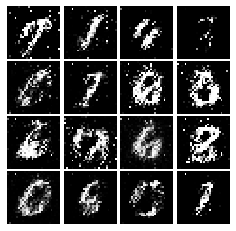

Epoch: 4, Iter: 2260, D: 1.361, G:0.8158


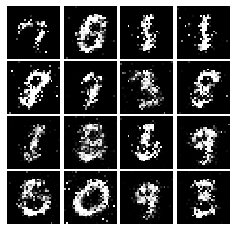

Epoch: 4, Iter: 2280, D: 1.251, G:0.9329


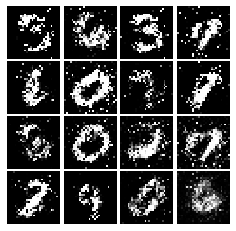

Epoch: 4, Iter: 2300, D: 1.299, G:0.7484


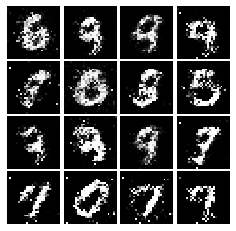

Epoch: 4, Iter: 2320, D: 1.263, G:0.6397


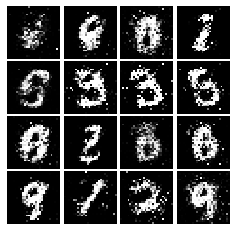

Epoch: 4, Iter: 2340, D: 1.247, G:0.9536


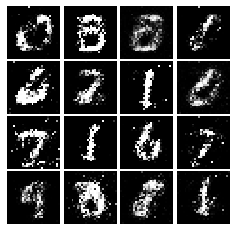

Epoch: 5, Iter: 2360, D: 1.248, G:0.8712


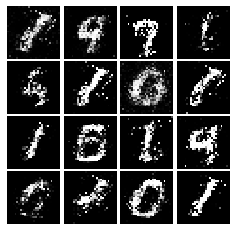

Epoch: 5, Iter: 2380, D: 1.371, G:0.787


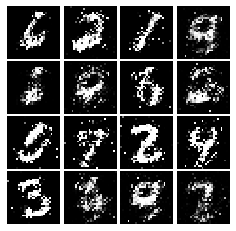

Epoch: 5, Iter: 2400, D: 1.325, G:1.25


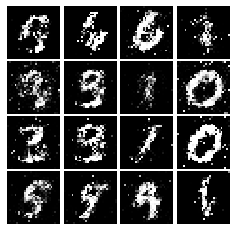

Epoch: 5, Iter: 2420, D: 1.261, G:1.122


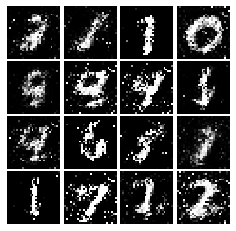

Epoch: 5, Iter: 2440, D: 1.323, G:0.8596


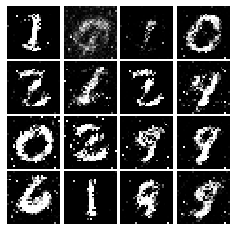

Epoch: 5, Iter: 2460, D: 1.286, G:0.9058


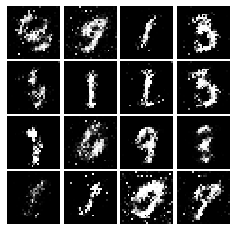

Epoch: 5, Iter: 2480, D: 1.244, G:0.9703


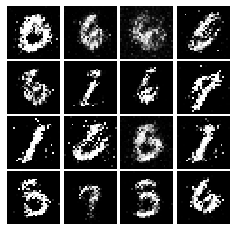

Epoch: 5, Iter: 2500, D: 1.164, G:0.8223


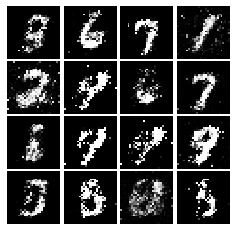

Epoch: 5, Iter: 2520, D: 1.351, G:0.9108


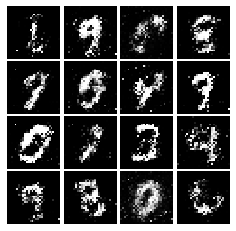

Epoch: 5, Iter: 2540, D: 1.318, G:0.7852


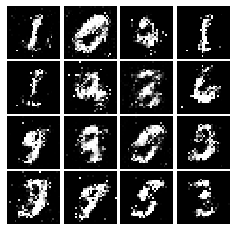

Epoch: 5, Iter: 2560, D: 1.413, G:0.8173


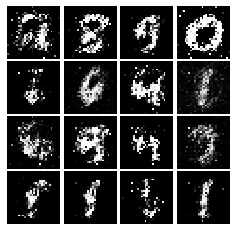

Epoch: 5, Iter: 2580, D: 1.272, G:0.917


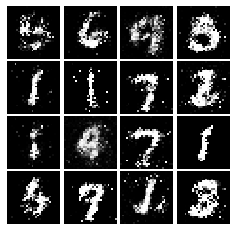

Epoch: 5, Iter: 2600, D: 1.397, G:0.759


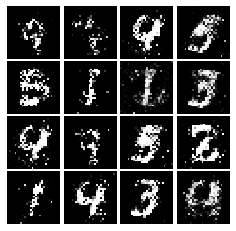

Epoch: 5, Iter: 2620, D: 1.297, G:0.954


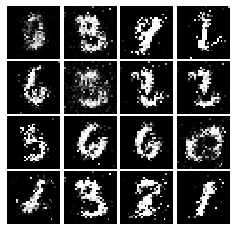

Epoch: 5, Iter: 2640, D: 1.332, G:0.8844


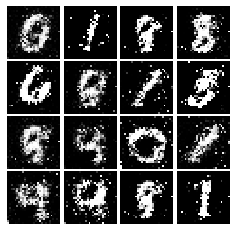

Epoch: 5, Iter: 2660, D: 1.284, G:0.8617


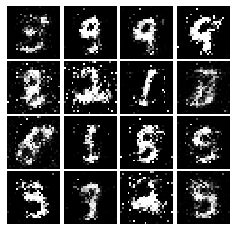

Epoch: 5, Iter: 2680, D: 1.284, G:0.8355


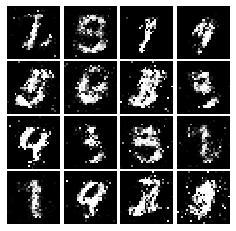

Epoch: 5, Iter: 2700, D: 1.5, G:0.8681


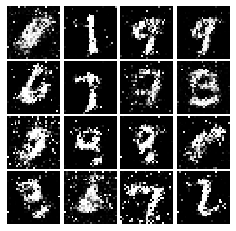

Epoch: 5, Iter: 2720, D: 1.244, G:0.9129


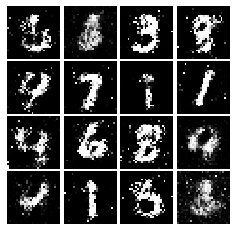

Epoch: 5, Iter: 2740, D: 1.3, G:0.9692


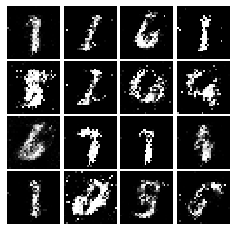

Epoch: 5, Iter: 2760, D: 1.404, G:0.8848


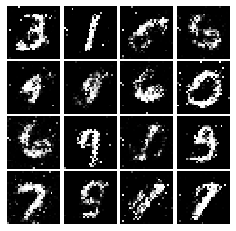

Epoch: 5, Iter: 2780, D: 1.235, G:1.002


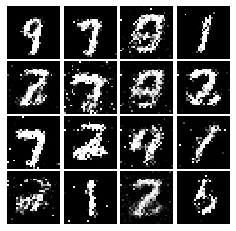

Epoch: 5, Iter: 2800, D: 1.284, G:0.7877


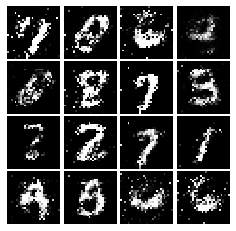

Epoch: 6, Iter: 2820, D: 1.389, G:1.565


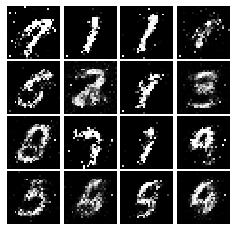

Epoch: 6, Iter: 2840, D: 1.238, G:0.9096


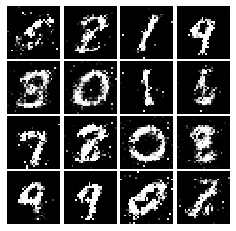

Epoch: 6, Iter: 2860, D: 1.371, G:0.8746


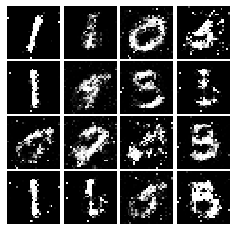

Epoch: 6, Iter: 2880, D: 1.306, G:0.8633


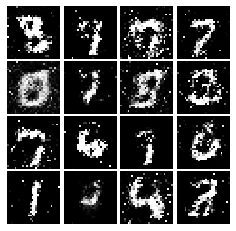

Epoch: 6, Iter: 2900, D: 1.27, G:0.8212


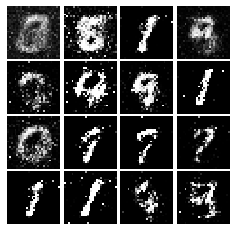

Epoch: 6, Iter: 2920, D: 1.313, G:0.8032


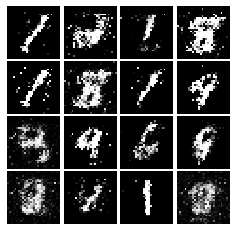

Epoch: 6, Iter: 2940, D: 1.339, G:0.7521


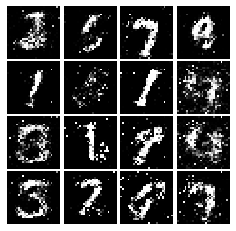

Epoch: 6, Iter: 2960, D: 1.37, G:0.8448


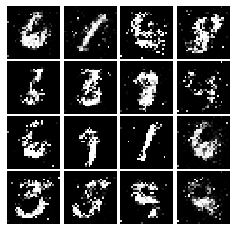

Epoch: 6, Iter: 2980, D: 1.368, G:0.7315


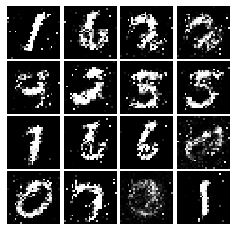

Epoch: 6, Iter: 3000, D: 1.239, G:0.9122


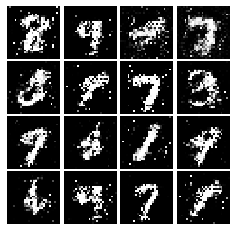

Epoch: 6, Iter: 3020, D: 1.366, G:0.8248


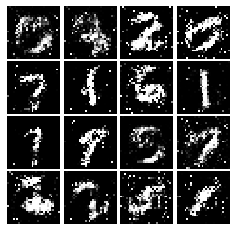

Epoch: 6, Iter: 3040, D: 1.351, G:0.8481


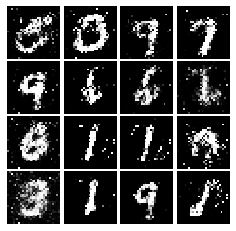

Epoch: 6, Iter: 3060, D: 1.259, G:0.7806


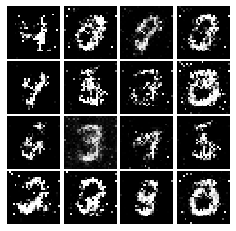

Epoch: 6, Iter: 3080, D: 1.36, G:0.7766


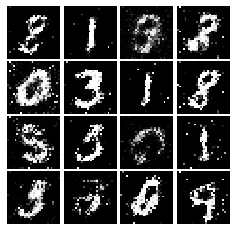

Epoch: 6, Iter: 3100, D: 1.328, G:0.7149


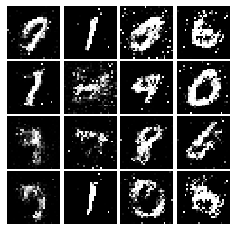

Epoch: 6, Iter: 3120, D: 1.297, G:0.7783


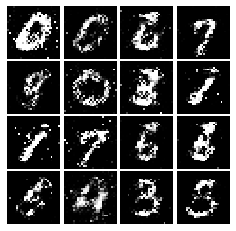

Epoch: 6, Iter: 3140, D: 1.365, G:0.8739


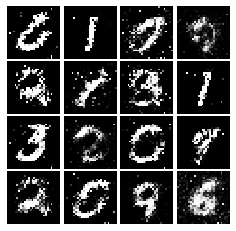

Epoch: 6, Iter: 3160, D: 1.352, G:0.7173


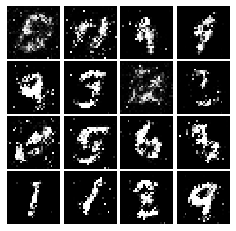

Epoch: 6, Iter: 3180, D: 1.34, G:0.8723


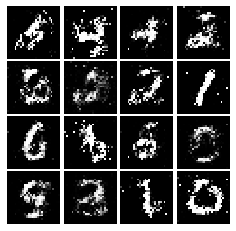

Epoch: 6, Iter: 3200, D: 1.336, G:0.8834


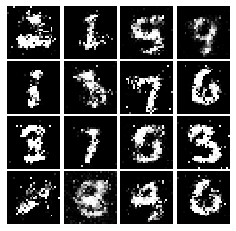

Epoch: 6, Iter: 3220, D: 1.311, G:0.8705


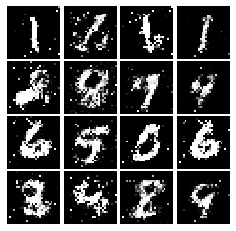

Epoch: 6, Iter: 3240, D: 1.252, G:0.9391


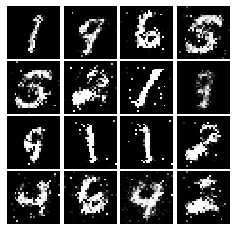

Epoch: 6, Iter: 3260, D: 1.313, G:0.9434


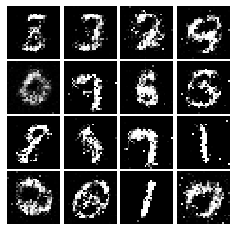

Epoch: 6, Iter: 3280, D: 1.315, G:0.9464


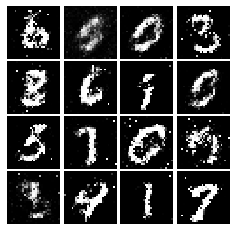

Epoch: 7, Iter: 3300, D: 1.258, G:0.9744


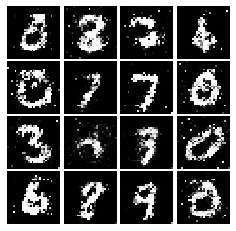

Epoch: 7, Iter: 3320, D: 1.26, G:0.7636


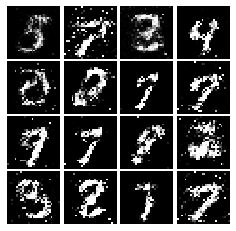

Epoch: 7, Iter: 3340, D: 1.406, G:0.6917


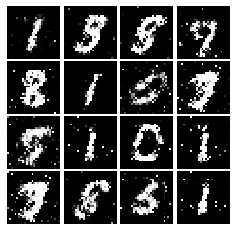

Epoch: 7, Iter: 3360, D: 1.438, G:0.9447


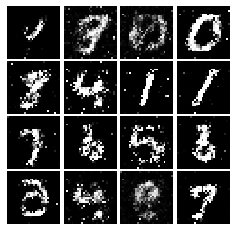

Epoch: 7, Iter: 3380, D: 1.239, G:0.8884


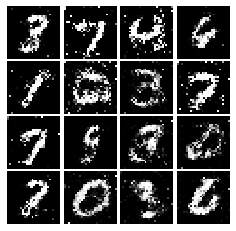

Epoch: 7, Iter: 3400, D: 1.332, G:1.002


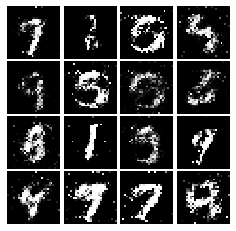

Epoch: 7, Iter: 3420, D: 1.34, G:0.8396


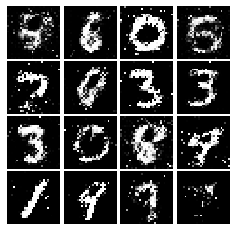

Epoch: 7, Iter: 3440, D: 1.314, G:0.8438


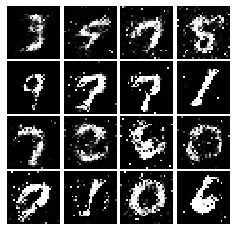

Epoch: 7, Iter: 3460, D: 1.221, G:0.8548


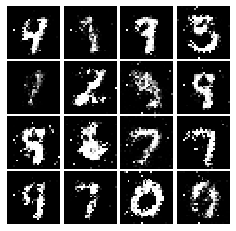

Epoch: 7, Iter: 3480, D: 1.193, G:0.8722


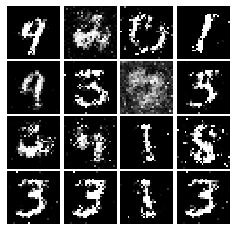

Epoch: 7, Iter: 3500, D: 1.348, G:0.8436


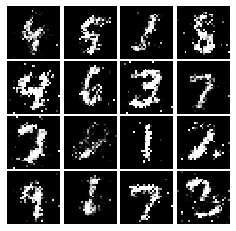

Epoch: 7, Iter: 3520, D: 1.383, G:0.7251


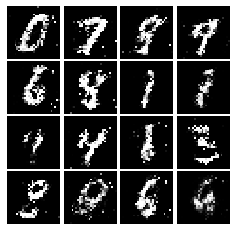

Epoch: 7, Iter: 3540, D: 1.286, G:0.9916


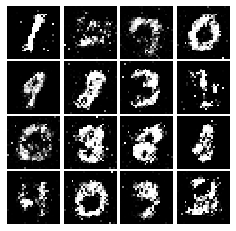

Epoch: 7, Iter: 3560, D: 1.381, G:0.7534


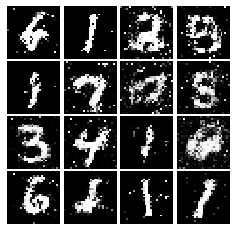

Epoch: 7, Iter: 3580, D: 1.371, G:0.7547


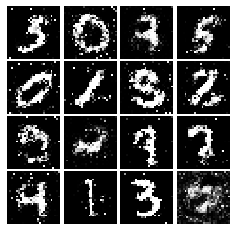

Epoch: 7, Iter: 3600, D: 1.319, G:0.7636


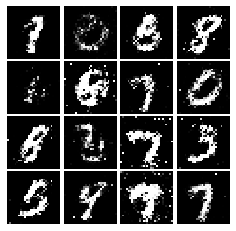

Epoch: 7, Iter: 3620, D: 1.316, G:0.771


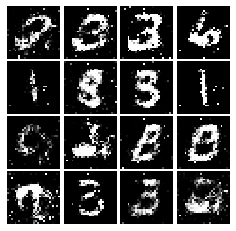

Epoch: 7, Iter: 3640, D: 1.286, G:0.7899


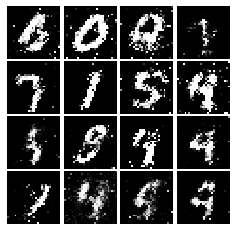

Epoch: 7, Iter: 3660, D: 1.296, G:1.014


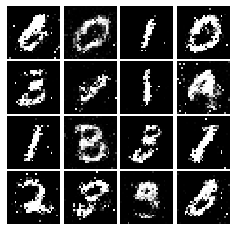

Epoch: 7, Iter: 3680, D: 1.285, G:0.8057


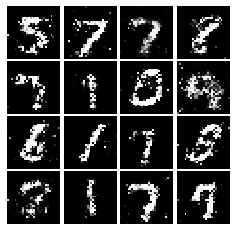

Epoch: 7, Iter: 3700, D: 1.331, G:0.7749


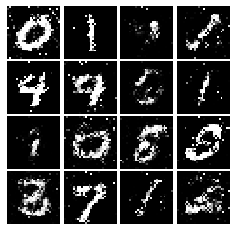

Epoch: 7, Iter: 3720, D: 1.314, G:0.8136


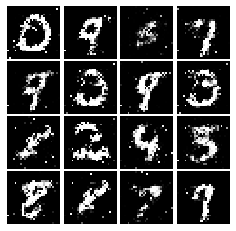

Epoch: 7, Iter: 3740, D: 1.289, G:0.8185


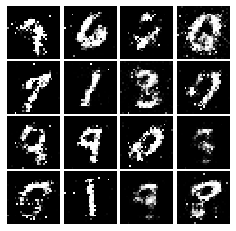

Epoch: 8, Iter: 3760, D: 1.281, G:1.013


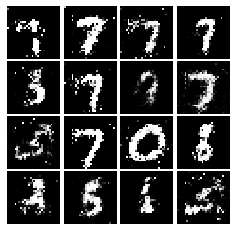

Epoch: 8, Iter: 3780, D: 1.251, G:0.8597


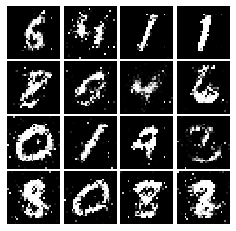

Epoch: 8, Iter: 3800, D: 1.345, G:0.9144


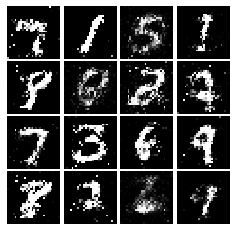

Epoch: 8, Iter: 3820, D: 1.331, G:0.8092


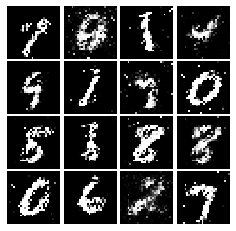

Epoch: 8, Iter: 3840, D: 1.319, G:0.8377


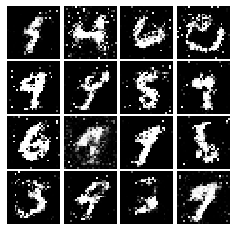

Epoch: 8, Iter: 3860, D: 1.255, G:0.9555


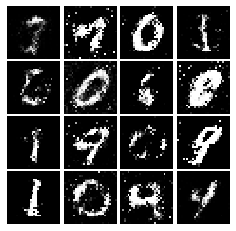

Epoch: 8, Iter: 3880, D: 1.306, G:0.746


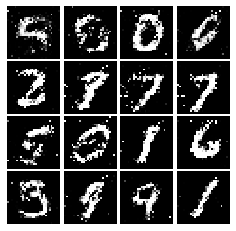

Epoch: 8, Iter: 3900, D: 1.433, G:0.818


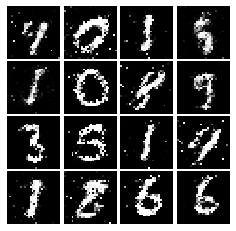

Epoch: 8, Iter: 3920, D: 1.302, G:0.7481


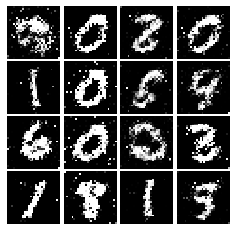

Epoch: 8, Iter: 3940, D: 1.301, G:0.8069


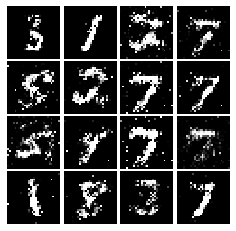

Epoch: 8, Iter: 3960, D: 1.407, G:0.8457


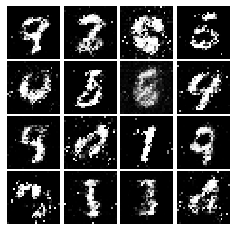

Epoch: 8, Iter: 3980, D: 1.369, G:0.8094


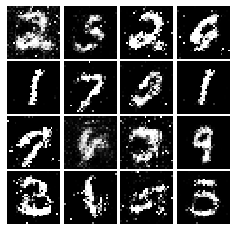

Epoch: 8, Iter: 4000, D: 1.343, G:0.8273


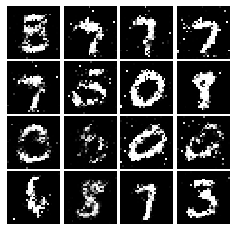

Epoch: 8, Iter: 4020, D: 1.312, G:0.8075


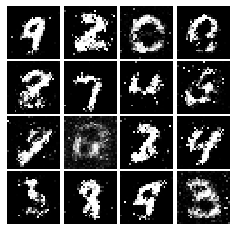

Epoch: 8, Iter: 4040, D: 1.374, G:0.7669


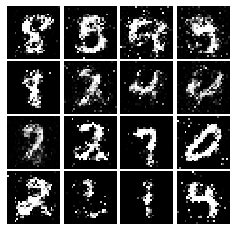

Epoch: 8, Iter: 4060, D: 1.299, G:0.7763


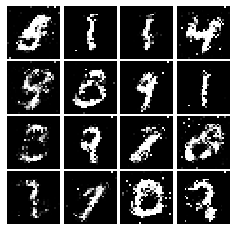

Epoch: 8, Iter: 4080, D: 1.455, G:0.7908


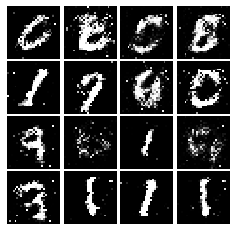

Epoch: 8, Iter: 4100, D: 1.295, G:1.049


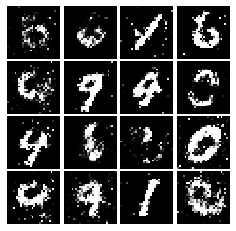

Epoch: 8, Iter: 4120, D: 1.389, G:0.7842


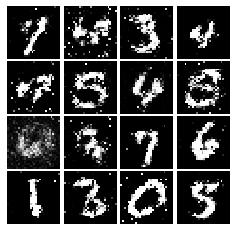

Epoch: 8, Iter: 4140, D: 1.324, G:0.7898


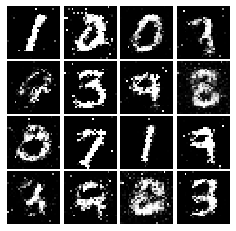

Epoch: 8, Iter: 4160, D: 1.398, G:0.8637


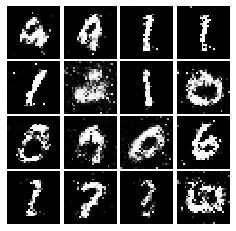

Epoch: 8, Iter: 4180, D: 1.346, G:0.783


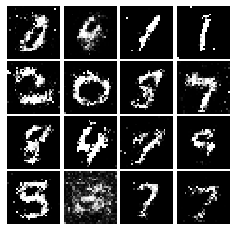

Epoch: 8, Iter: 4200, D: 1.333, G:0.8384


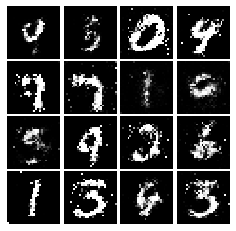

Epoch: 8, Iter: 4220, D: 1.298, G:0.8628


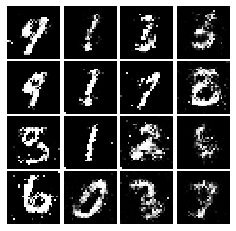

Epoch: 9, Iter: 4240, D: 1.354, G:0.7563


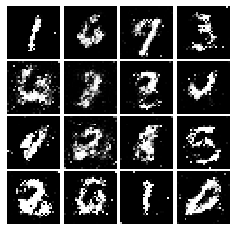

Epoch: 9, Iter: 4260, D: 1.342, G:0.7855


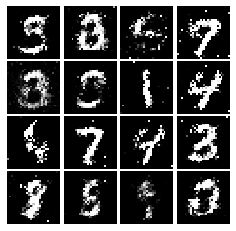

Epoch: 9, Iter: 4280, D: 1.428, G:0.8402


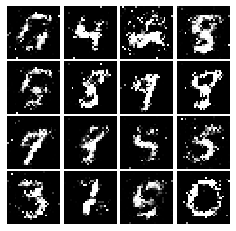

Epoch: 9, Iter: 4300, D: 1.337, G:0.9111


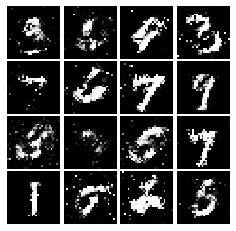

Epoch: 9, Iter: 4320, D: 1.344, G:0.8177


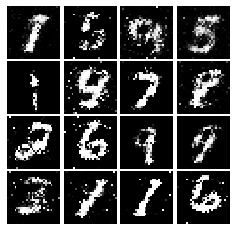

Epoch: 9, Iter: 4340, D: 1.367, G:0.9496


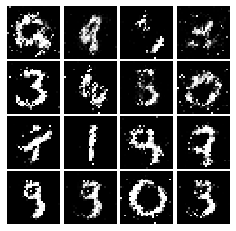

Epoch: 9, Iter: 4360, D: 1.335, G:0.7727


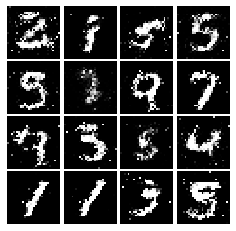

Epoch: 9, Iter: 4380, D: 1.415, G:0.8145


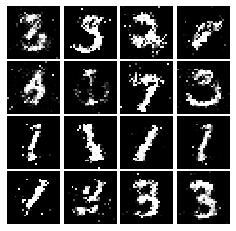

Epoch: 9, Iter: 4400, D: 1.294, G:0.8496


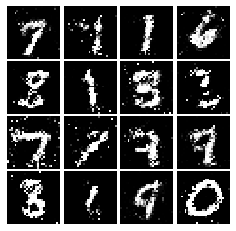

Epoch: 9, Iter: 4420, D: 1.311, G:0.8039


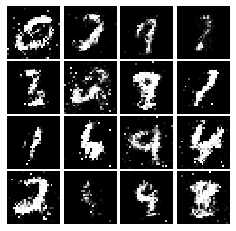

Epoch: 9, Iter: 4440, D: 1.325, G:0.76


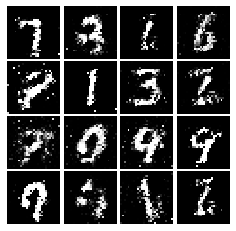

Epoch: 9, Iter: 4460, D: 1.404, G:0.794


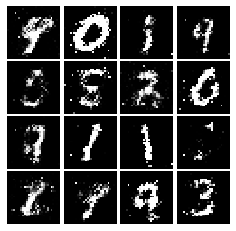

Epoch: 9, Iter: 4480, D: 1.299, G:0.7911


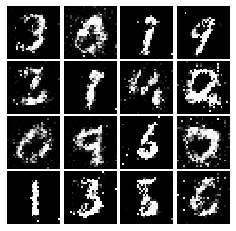

Epoch: 9, Iter: 4500, D: 1.46, G:0.8259


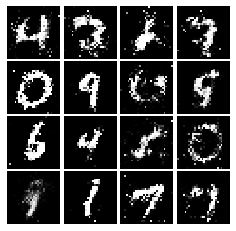

Epoch: 9, Iter: 4520, D: 1.344, G:0.7576


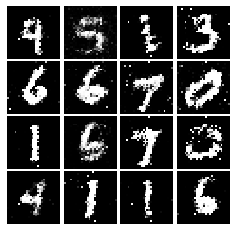

Epoch: 9, Iter: 4540, D: 1.387, G:0.7665


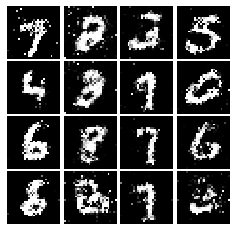

Epoch: 9, Iter: 4560, D: 1.315, G:0.8038


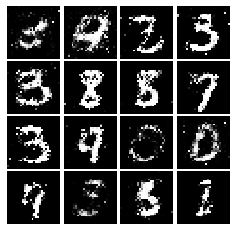

Epoch: 9, Iter: 4580, D: 1.366, G:0.7852


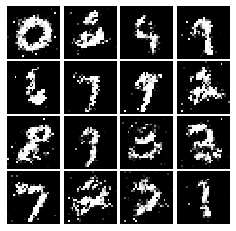

Epoch: 9, Iter: 4600, D: 1.383, G:0.7387


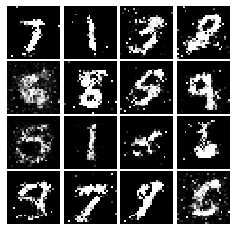

Epoch: 9, Iter: 4620, D: 1.408, G:0.881


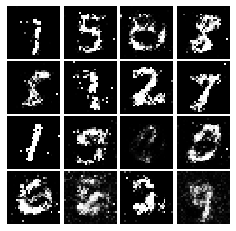

Epoch: 9, Iter: 4640, D: 1.332, G:0.696


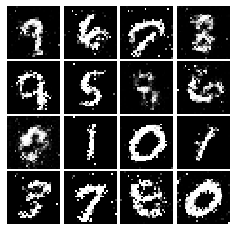

Epoch: 9, Iter: 4660, D: 1.368, G:0.8911


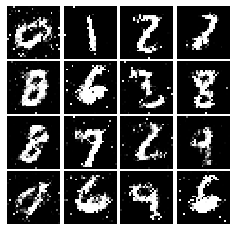

Epoch: 9, Iter: 4680, D: 1.349, G:0.7244


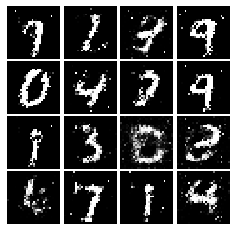

Final images


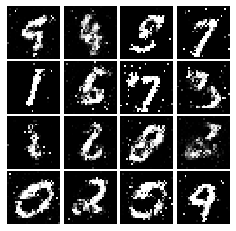

In [28]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [29]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 *tf.reduce_mean (tf.square(scores_real -1))+0.5 *tf.reduce_mean(tf.square(scores_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 *tf.reduce_mean (tf.square(scores_fake -1))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [30]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.5339, G:0.3883


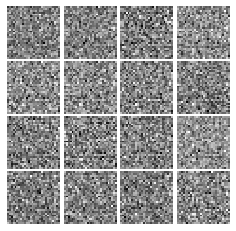

Epoch: 0, Iter: 20, D: 0.1404, G:1.163


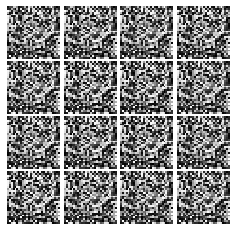

Epoch: 0, Iter: 40, D: 0.01624, G:0.7988


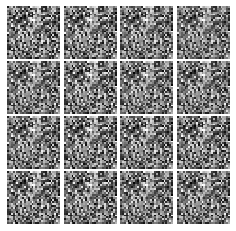

Epoch: 0, Iter: 60, D: 0.007932, G:0.7022


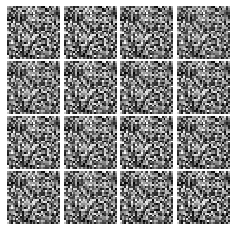

Epoch: 0, Iter: 80, D: 0.08107, G:0.9464


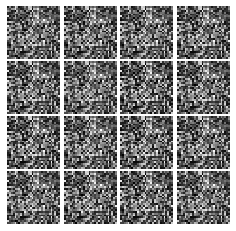

Epoch: 0, Iter: 100, D: 0.02481, G:0.6634


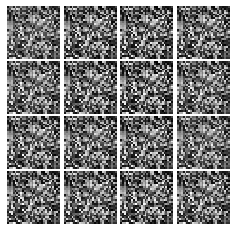

Epoch: 0, Iter: 120, D: 0.00361, G:0.5942


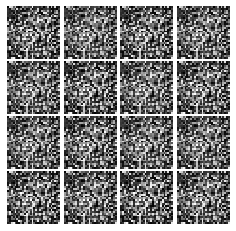

Epoch: 0, Iter: 140, D: 0.00487, G:0.4529


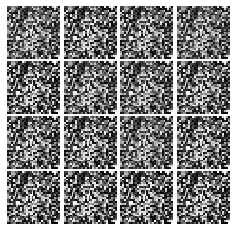

Epoch: 0, Iter: 160, D: 0.2524, G:0.269


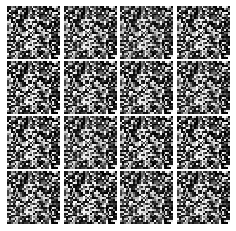

Epoch: 0, Iter: 180, D: 0.01678, G:0.6098


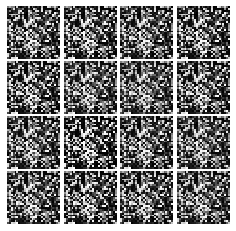

Epoch: 0, Iter: 200, D: 0.005231, G:0.4185


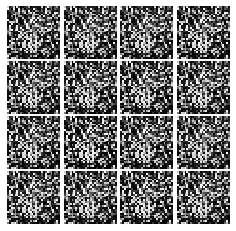

Epoch: 0, Iter: 220, D: 0.03628, G:0.187


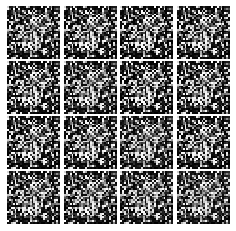

Epoch: 0, Iter: 240, D: 0.009278, G:0.7364


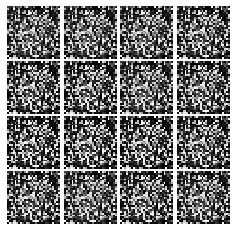

Epoch: 0, Iter: 260, D: 0.005078, G:0.6105


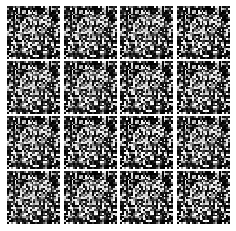

Epoch: 0, Iter: 280, D: 0.001858, G:0.5023


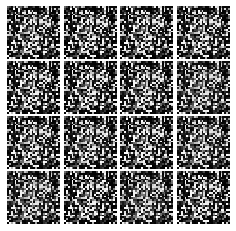

Epoch: 0, Iter: 300, D: 0.001622, G:0.577


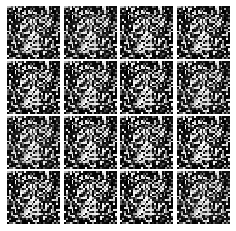

Epoch: 0, Iter: 320, D: 0.002305, G:0.4622


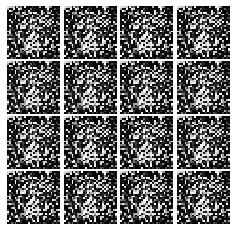

Epoch: 0, Iter: 340, D: 0.1041, G:1.434


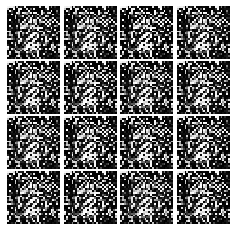

Epoch: 0, Iter: 360, D: 0.001882, G:0.5655


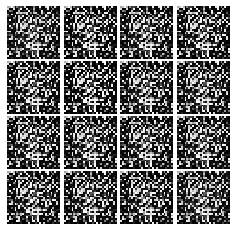

Epoch: 0, Iter: 380, D: 0.1236, G:0.4531


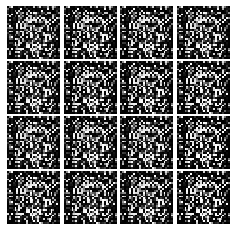

Epoch: 0, Iter: 400, D: 0.008913, G:0.6043


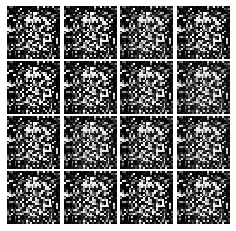

Epoch: 0, Iter: 420, D: 0.01127, G:0.6648


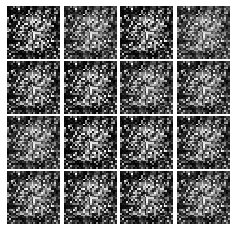

Epoch: 0, Iter: 440, D: 0.2205, G:0.1862


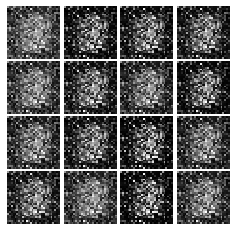

Epoch: 0, Iter: 460, D: 0.1318, G:0.6691


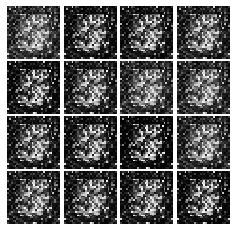

Epoch: 1, Iter: 480, D: 0.2877, G:0.2788


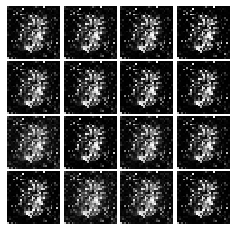

Epoch: 1, Iter: 500, D: 0.207, G:0.407


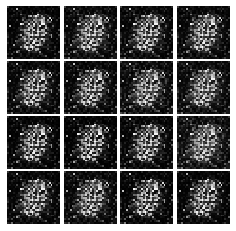

Epoch: 1, Iter: 520, D: 0.4648, G:1.183


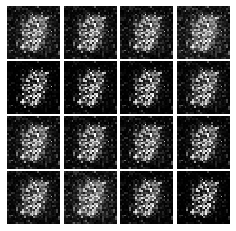

Epoch: 1, Iter: 540, D: 0.1571, G:0.2841


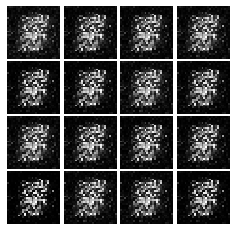

Epoch: 1, Iter: 560, D: 0.1548, G:0.4756


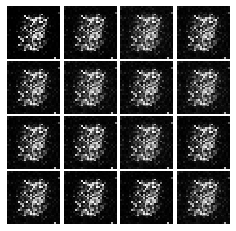

Epoch: 1, Iter: 580, D: 0.3, G:0.1462


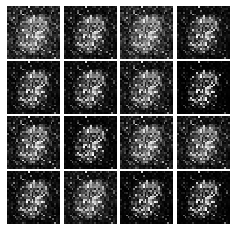

Epoch: 1, Iter: 600, D: 0.1405, G:0.39


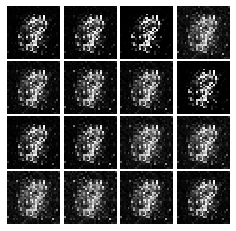

Epoch: 1, Iter: 620, D: 0.1251, G:0.2472


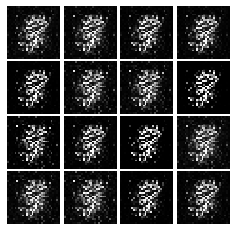

Epoch: 1, Iter: 640, D: 0.5738, G:0.404


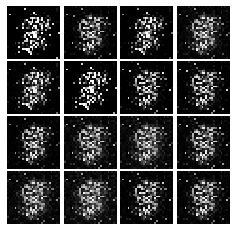

Epoch: 1, Iter: 660, D: 0.1068, G:0.466


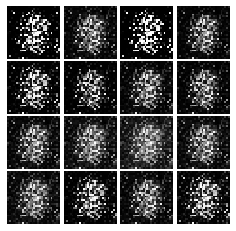

Epoch: 1, Iter: 680, D: 0.1533, G:0.3299


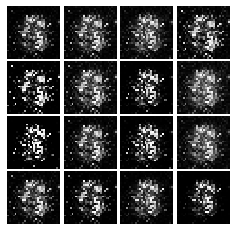

Epoch: 1, Iter: 700, D: 0.2125, G:0.7109


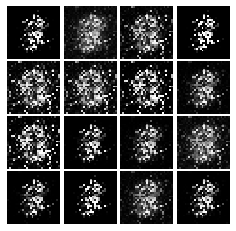

Epoch: 1, Iter: 720, D: 0.2052, G:0.2014


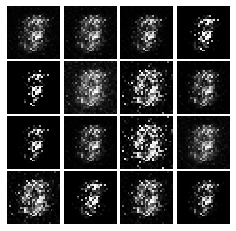

Epoch: 1, Iter: 740, D: 0.1944, G:0.2691


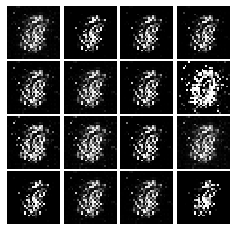

Epoch: 1, Iter: 760, D: 0.1828, G:0.4461


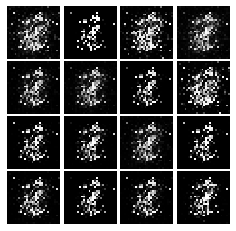

Epoch: 1, Iter: 780, D: 0.1593, G:0.3452


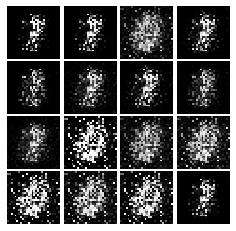

Epoch: 1, Iter: 800, D: 0.1847, G:0.2527


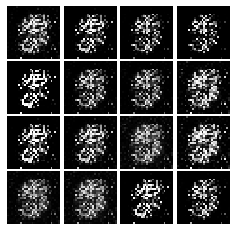

Epoch: 1, Iter: 820, D: 0.2049, G:0.4037


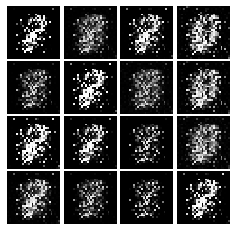

Epoch: 1, Iter: 840, D: 0.1897, G:0.4459


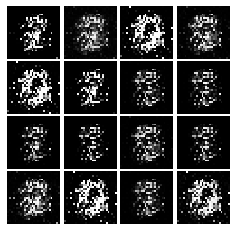

Epoch: 1, Iter: 860, D: 0.1529, G:0.2394


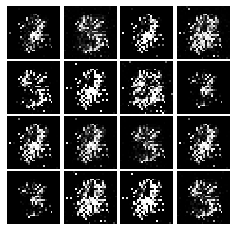

Epoch: 1, Iter: 880, D: 0.1943, G:0.5547


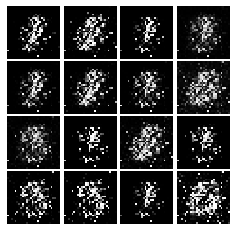

Epoch: 1, Iter: 900, D: 0.1693, G:0.1389


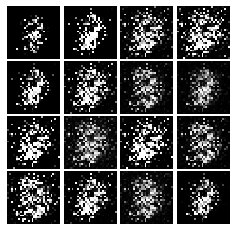

Epoch: 1, Iter: 920, D: 0.393, G:1.228


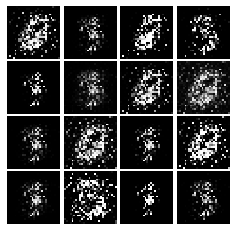

Epoch: 2, Iter: 940, D: 0.1403, G:0.2805


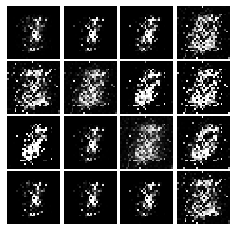

Epoch: 2, Iter: 960, D: 0.0997, G:0.333


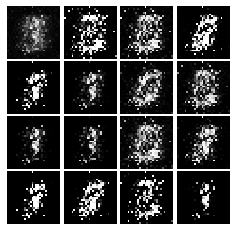

Epoch: 2, Iter: 980, D: 0.1309, G:0.1547


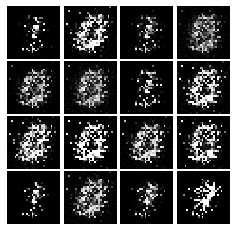

Epoch: 2, Iter: 1000, D: 0.1724, G:0.3573


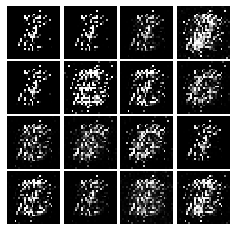

Epoch: 2, Iter: 1020, D: 0.5638, G:0.3721


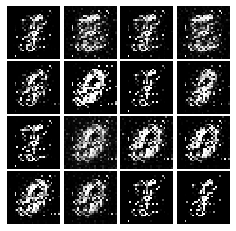

Epoch: 2, Iter: 1040, D: 0.186, G:0.3792


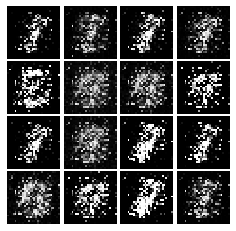

Epoch: 2, Iter: 1060, D: 0.2724, G:0.2811


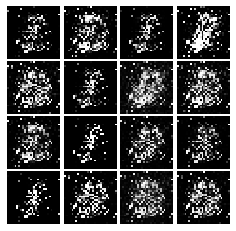

Epoch: 2, Iter: 1080, D: 0.2246, G:0.3106


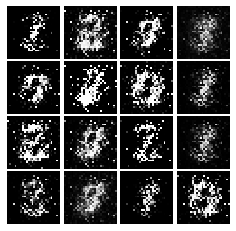

Epoch: 2, Iter: 1100, D: 0.1902, G:0.2258


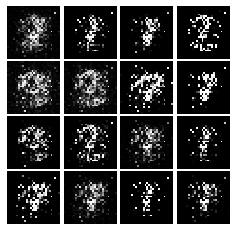

Epoch: 2, Iter: 1120, D: 0.1812, G:0.7938


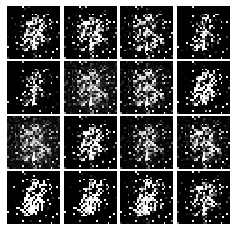

Epoch: 2, Iter: 1140, D: 0.1798, G:0.3099


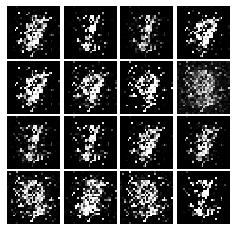

Epoch: 2, Iter: 1160, D: 0.1475, G:0.2674


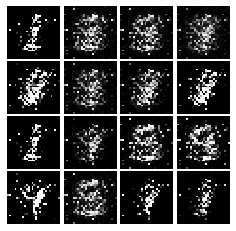

Epoch: 2, Iter: 1180, D: 0.3616, G:0.2447


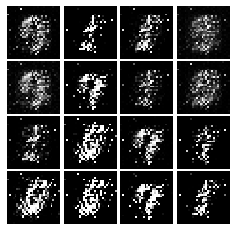

Epoch: 2, Iter: 1200, D: 0.1804, G:0.257


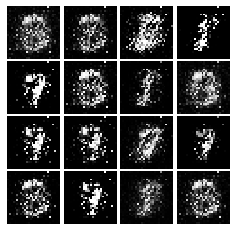

Epoch: 2, Iter: 1220, D: 0.1903, G:0.2452


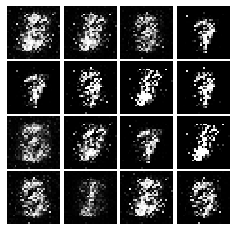

Epoch: 2, Iter: 1240, D: 0.2417, G:0.3549


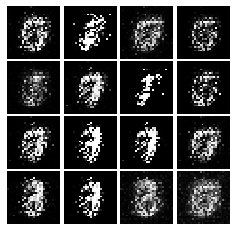

Epoch: 2, Iter: 1260, D: 0.2351, G:0.2222


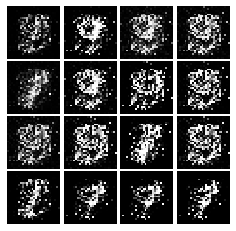

Epoch: 2, Iter: 1280, D: 0.2254, G:0.2499


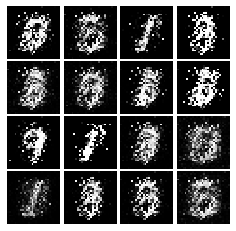

Epoch: 2, Iter: 1300, D: 0.2271, G:0.2123


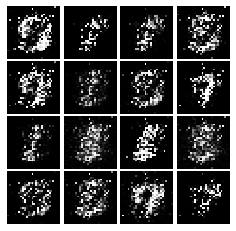

Epoch: 2, Iter: 1320, D: 0.1978, G:0.2658


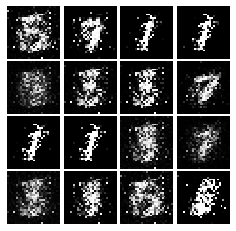

Epoch: 2, Iter: 1340, D: 0.1893, G:0.1855


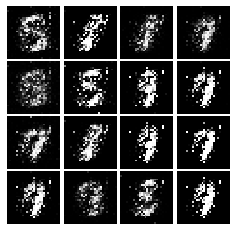

Epoch: 2, Iter: 1360, D: 0.1694, G:0.212


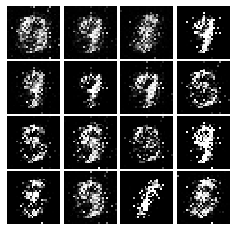

Epoch: 2, Iter: 1380, D: 0.2508, G:0.436


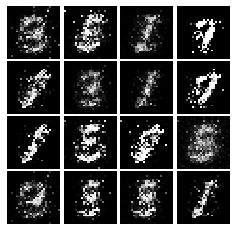

Epoch: 2, Iter: 1400, D: 0.1386, G:0.2361


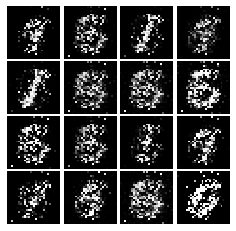

Epoch: 3, Iter: 1420, D: 0.2082, G:0.3226


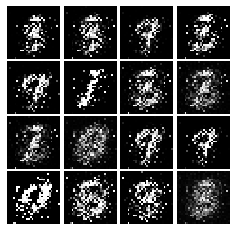

Epoch: 3, Iter: 1440, D: 0.1355, G:0.3098


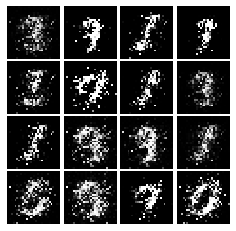

Epoch: 3, Iter: 1460, D: 0.2064, G:0.1929


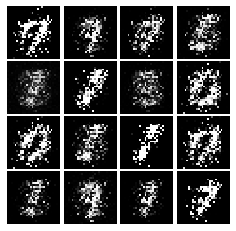

Epoch: 3, Iter: 1480, D: 0.794, G:0.2532


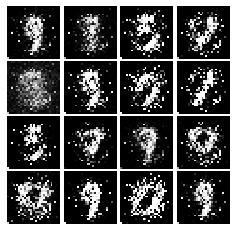

Epoch: 3, Iter: 1500, D: 0.5835, G:0.3323


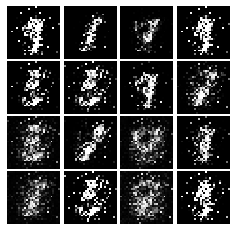

Epoch: 3, Iter: 1520, D: 0.184, G:0.149


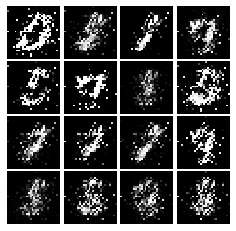

Epoch: 3, Iter: 1540, D: 0.2833, G:0.211


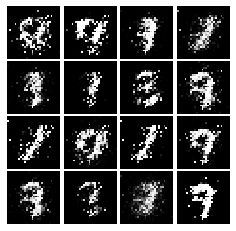

Epoch: 3, Iter: 1560, D: 0.1919, G:0.256


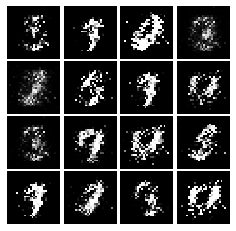

Epoch: 3, Iter: 1580, D: 0.1991, G:0.2309


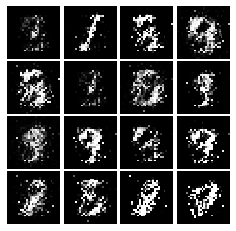

Epoch: 3, Iter: 1600, D: 0.1637, G:0.3478


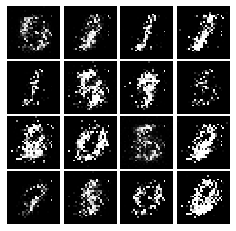

Epoch: 3, Iter: 1620, D: 0.1624, G:0.3454


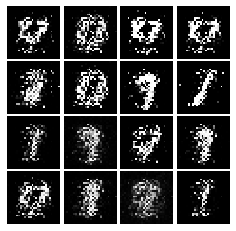

Epoch: 3, Iter: 1640, D: 0.2004, G:0.2385


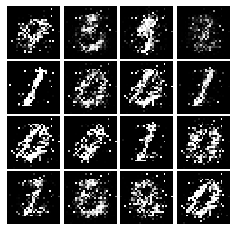

Epoch: 3, Iter: 1660, D: 0.1851, G:0.1831


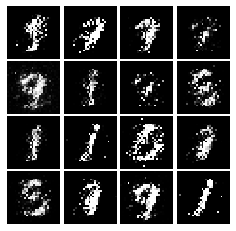

Epoch: 3, Iter: 1680, D: 0.2024, G:0.2329


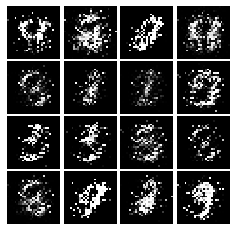

Epoch: 3, Iter: 1700, D: 0.2093, G:0.1488


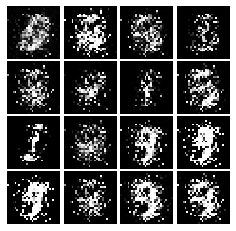

Epoch: 3, Iter: 1720, D: 0.1268, G:0.3604


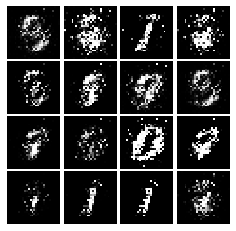

Epoch: 3, Iter: 1740, D: 0.12, G:0.4778


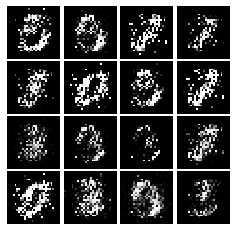

Epoch: 3, Iter: 1760, D: 0.1426, G:1.19


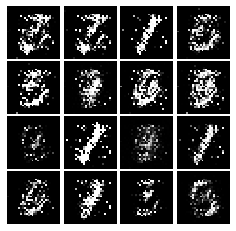

Epoch: 3, Iter: 1780, D: 0.151, G:0.3053


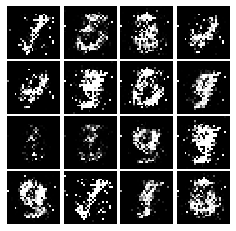

Epoch: 3, Iter: 1800, D: 0.1317, G:0.1584


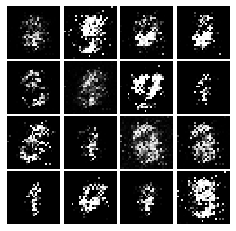

Epoch: 3, Iter: 1820, D: 0.2118, G:0.494


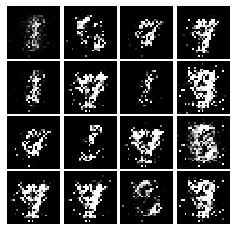

Epoch: 3, Iter: 1840, D: 0.1959, G:0.3401


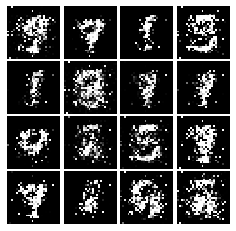

Epoch: 3, Iter: 1860, D: 0.2232, G:0.2467


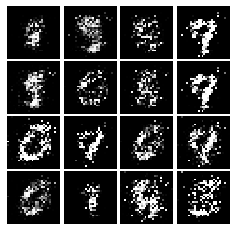

Epoch: 4, Iter: 1880, D: 0.1662, G:0.241


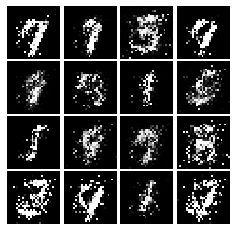

Epoch: 4, Iter: 1900, D: 0.1681, G:0.2406


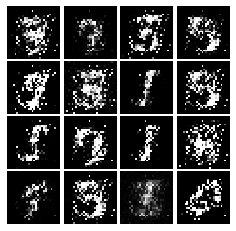

Epoch: 4, Iter: 1920, D: 0.1922, G:0.3297


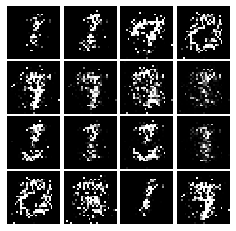

Epoch: 4, Iter: 1940, D: 0.2035, G:0.2151


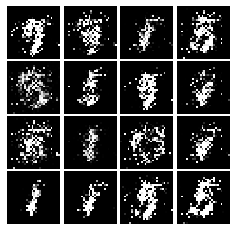

Epoch: 4, Iter: 1960, D: 0.1929, G:0.6331


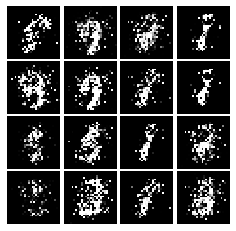

Epoch: 4, Iter: 1980, D: 0.1646, G:0.3108


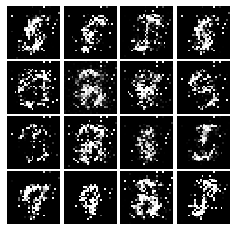

Epoch: 4, Iter: 2000, D: 0.1525, G:0.2352


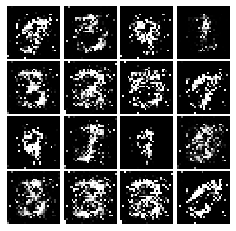

Epoch: 4, Iter: 2020, D: 0.1843, G:0.271


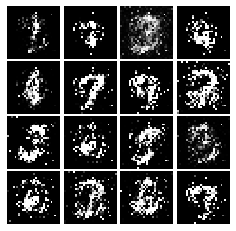

Epoch: 4, Iter: 2040, D: 0.1735, G:0.2519


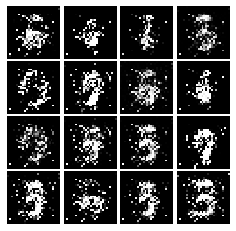

Epoch: 4, Iter: 2060, D: 0.1483, G:0.4445


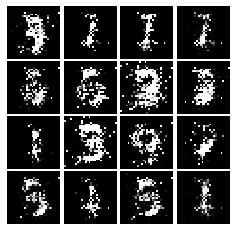

Epoch: 4, Iter: 2080, D: 0.1821, G:0.2597


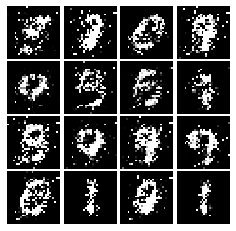

Epoch: 4, Iter: 2100, D: 0.2324, G:0.2134


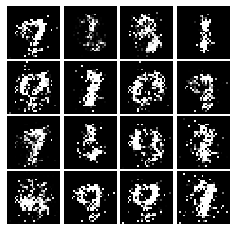

Epoch: 4, Iter: 2120, D: 0.1816, G:0.2942


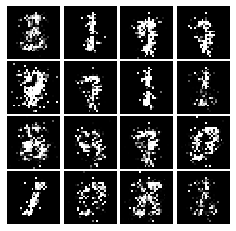

Epoch: 4, Iter: 2140, D: 0.1857, G:0.2791


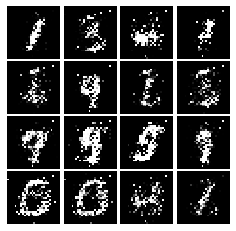

Epoch: 4, Iter: 2160, D: 0.203, G:0.173


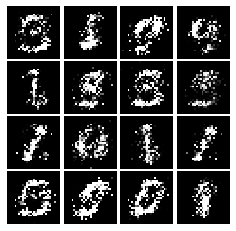

Epoch: 4, Iter: 2180, D: 0.1672, G:0.2773


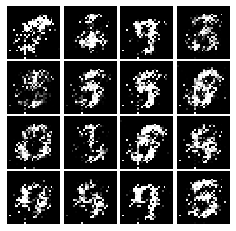

Epoch: 4, Iter: 2200, D: 0.184, G:0.2352


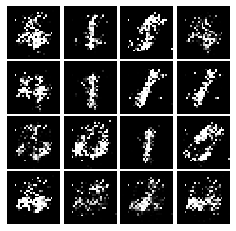

Epoch: 4, Iter: 2220, D: 0.1968, G:0.2112


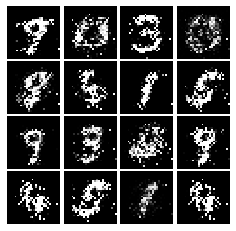

Epoch: 4, Iter: 2240, D: 0.188, G:0.2246


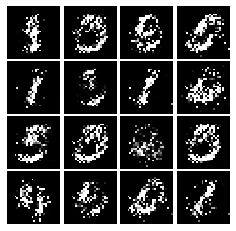

Epoch: 4, Iter: 2260, D: 0.2085, G:0.2091


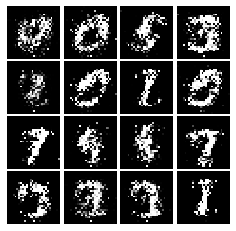

Epoch: 4, Iter: 2280, D: 0.2315, G:0.1981


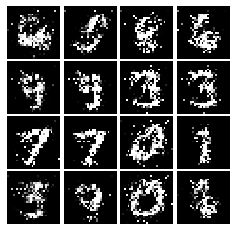

Epoch: 4, Iter: 2300, D: 0.2233, G:0.2003


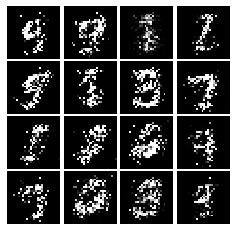

Epoch: 4, Iter: 2320, D: 0.2002, G:0.2202


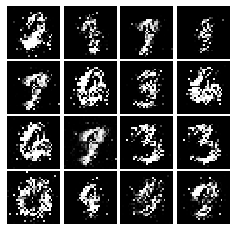

Epoch: 4, Iter: 2340, D: 0.1564, G:0.34


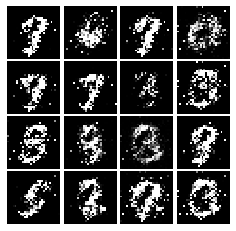

Epoch: 5, Iter: 2360, D: 0.2218, G:0.1752


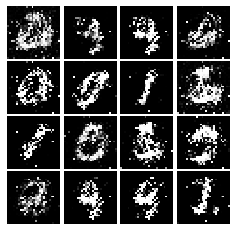

Epoch: 5, Iter: 2380, D: 0.2008, G:0.1657


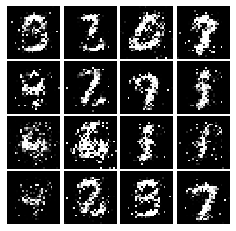

Epoch: 5, Iter: 2400, D: 0.2329, G:0.2261


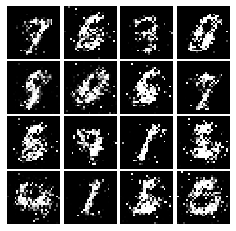

Epoch: 5, Iter: 2420, D: 0.2098, G:0.2362


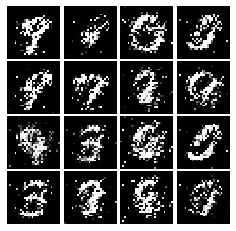

Epoch: 5, Iter: 2440, D: 0.2109, G:0.1906


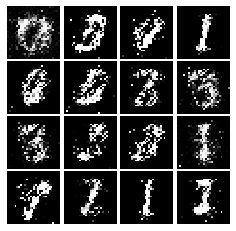

Epoch: 5, Iter: 2460, D: 0.1913, G:0.2514


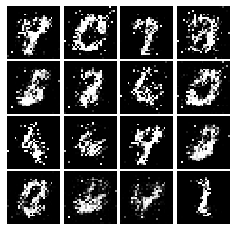

Epoch: 5, Iter: 2480, D: 0.2131, G:0.1808


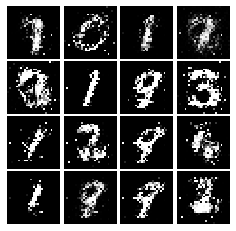

Epoch: 5, Iter: 2500, D: 0.2236, G:0.2809


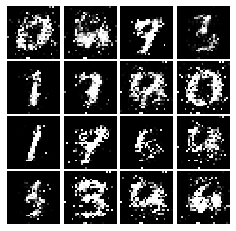

Epoch: 5, Iter: 2520, D: 0.2844, G:0.1755


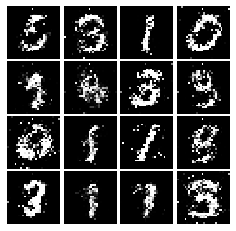

Epoch: 5, Iter: 2540, D: 0.2393, G:0.169


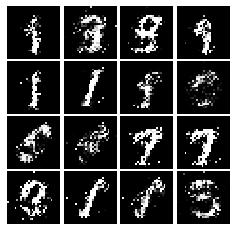

Epoch: 5, Iter: 2560, D: 0.2266, G:0.1842


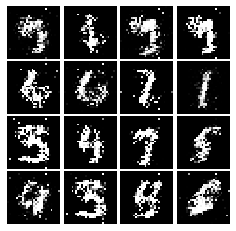

Epoch: 5, Iter: 2580, D: 0.2018, G:0.1875


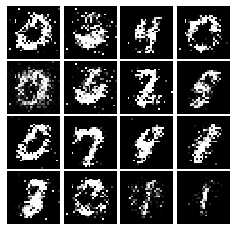

Epoch: 5, Iter: 2600, D: 0.261, G:0.1437


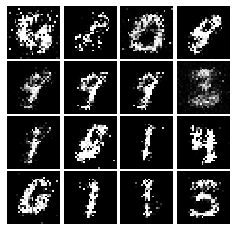

Epoch: 5, Iter: 2620, D: 0.2169, G:0.1637


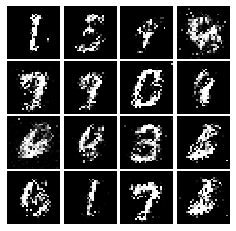

Epoch: 5, Iter: 2640, D: 0.2222, G:0.1943


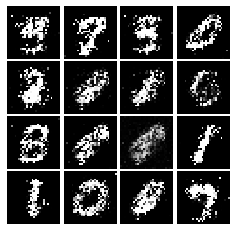

Epoch: 5, Iter: 2660, D: 0.2197, G:0.2094


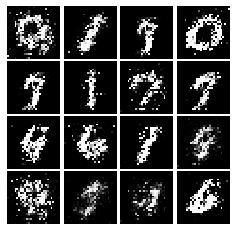

Epoch: 5, Iter: 2680, D: 0.2289, G:0.19


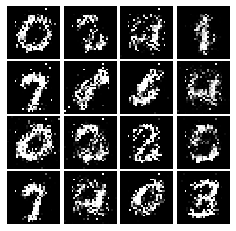

Epoch: 5, Iter: 2700, D: 0.2367, G:0.167


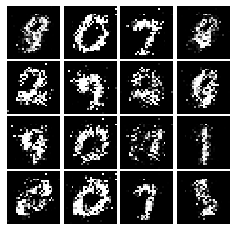

Epoch: 5, Iter: 2720, D: 0.2226, G:0.2059


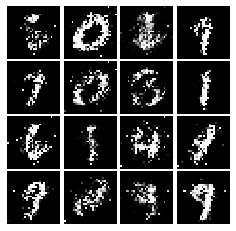

Epoch: 5, Iter: 2740, D: 0.2126, G:0.2515


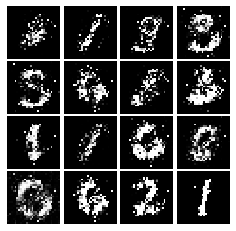

Epoch: 5, Iter: 2760, D: 0.2244, G:0.1746


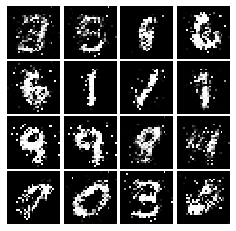

Epoch: 5, Iter: 2780, D: 0.2092, G:0.1973


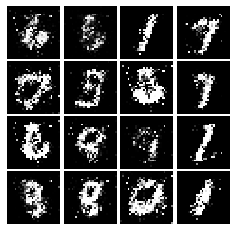

Epoch: 5, Iter: 2800, D: 0.2293, G:0.1517


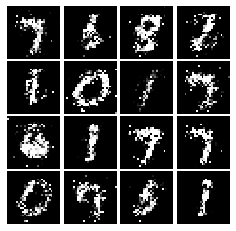

Epoch: 6, Iter: 2820, D: 0.2285, G:0.1651


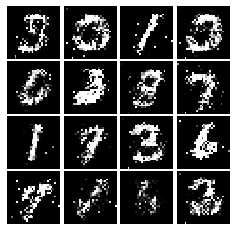

Epoch: 6, Iter: 2840, D: 0.2304, G:0.1788


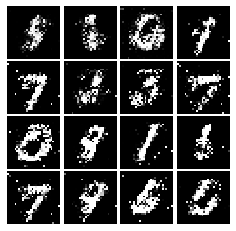

Epoch: 6, Iter: 2860, D: 0.2296, G:0.1498


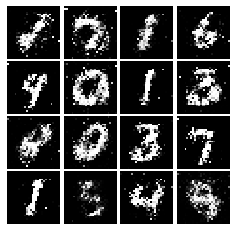

Epoch: 6, Iter: 2880, D: 0.2182, G:0.1788


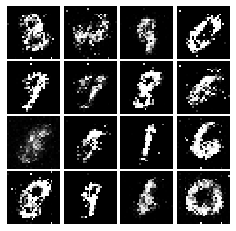

Epoch: 6, Iter: 2900, D: 0.2312, G:0.1504


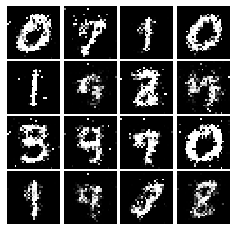

Epoch: 6, Iter: 2920, D: 0.2351, G:0.1324


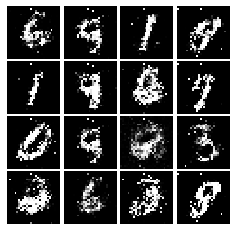

Epoch: 6, Iter: 2940, D: 0.2193, G:0.1598


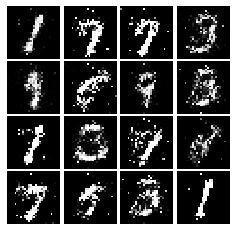

Epoch: 6, Iter: 2960, D: 0.2223, G:0.1525


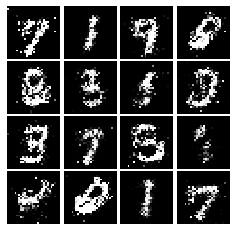

Epoch: 6, Iter: 2980, D: 0.2551, G:0.1582


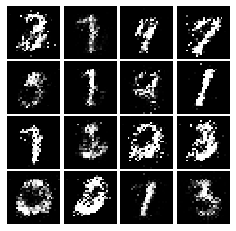

Epoch: 6, Iter: 3000, D: 0.2227, G:0.175


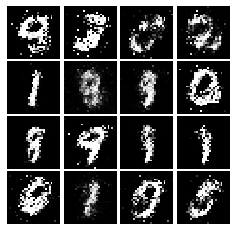

Epoch: 6, Iter: 3020, D: 0.2226, G:0.1635


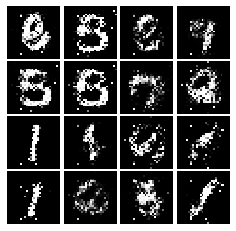

Epoch: 6, Iter: 3040, D: 0.2517, G:0.1682


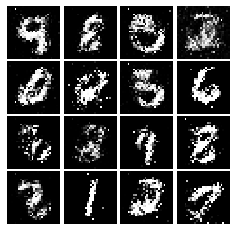

Epoch: 6, Iter: 3060, D: 0.2473, G:0.1726


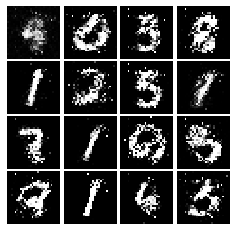

Epoch: 6, Iter: 3080, D: 0.2101, G:0.1626


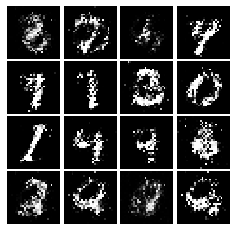

Epoch: 6, Iter: 3100, D: 0.2177, G:0.1595


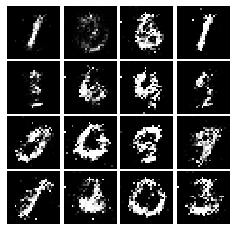

Epoch: 6, Iter: 3120, D: 0.212, G:0.1864


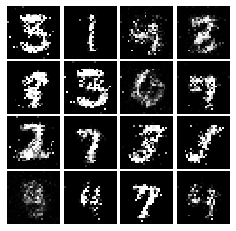

Epoch: 6, Iter: 3140, D: 0.2534, G:0.1763


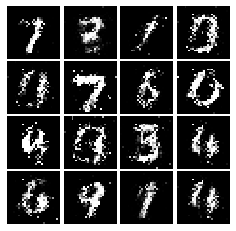

Epoch: 6, Iter: 3160, D: 0.2341, G:0.1528


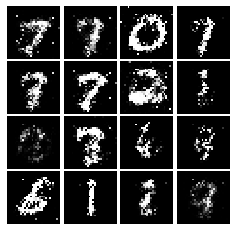

Epoch: 6, Iter: 3180, D: 0.2402, G:0.1624


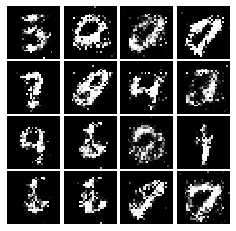

Epoch: 6, Iter: 3200, D: 0.228, G:0.1482


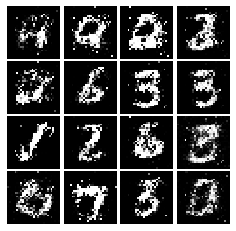

Epoch: 6, Iter: 3220, D: 0.2345, G:0.1505


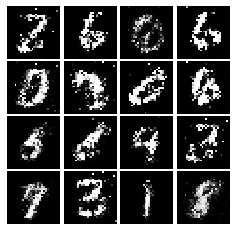

Epoch: 6, Iter: 3240, D: 0.2344, G:0.1723


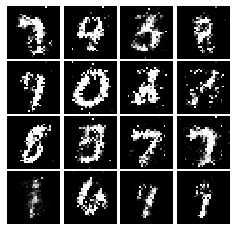

Epoch: 6, Iter: 3260, D: 0.2425, G:0.1356


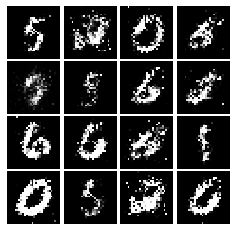

Epoch: 6, Iter: 3280, D: 0.2204, G:0.1868


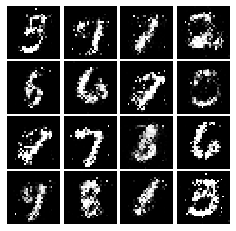

Epoch: 7, Iter: 3300, D: 0.1966, G:0.1681


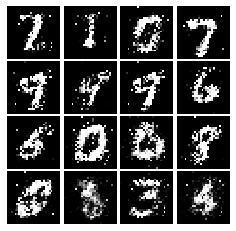

Epoch: 7, Iter: 3320, D: 0.2253, G:0.2037


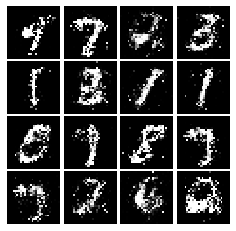

Epoch: 7, Iter: 3340, D: 0.2332, G:0.1917


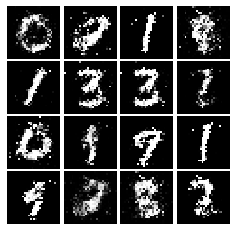

Epoch: 7, Iter: 3360, D: 0.2583, G:0.1568


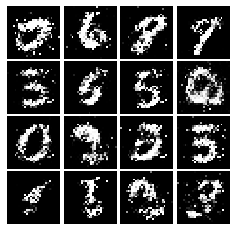

Epoch: 7, Iter: 3380, D: 0.2288, G:0.2013


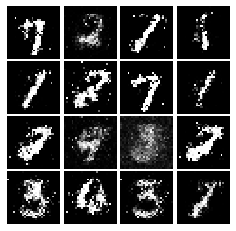

Epoch: 7, Iter: 3400, D: 0.242, G:0.1604


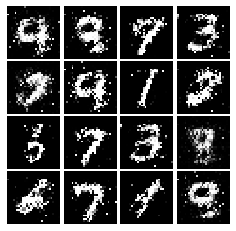

Epoch: 7, Iter: 3420, D: 0.2201, G:0.166


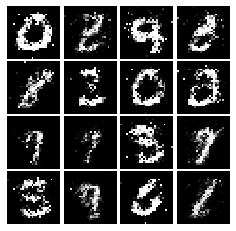

Epoch: 7, Iter: 3440, D: 0.2134, G:0.202


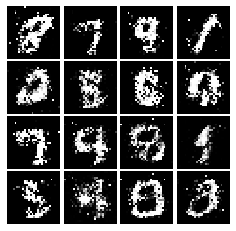

Epoch: 7, Iter: 3460, D: 0.2122, G:0.1739


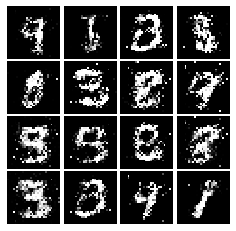

Epoch: 7, Iter: 3480, D: 0.199, G:0.1921


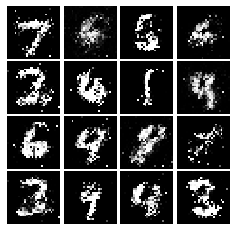

Epoch: 7, Iter: 3500, D: 0.2042, G:0.1799


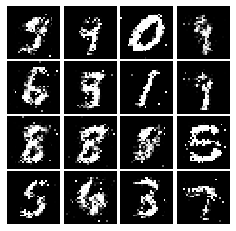

Epoch: 7, Iter: 3520, D: 0.2113, G:0.1496


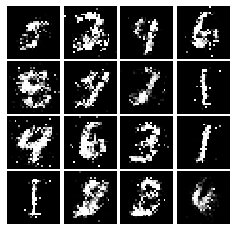

Epoch: 7, Iter: 3540, D: 0.205, G:0.1971


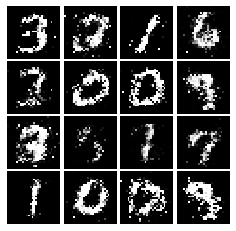

Epoch: 7, Iter: 3560, D: 0.2075, G:0.1863


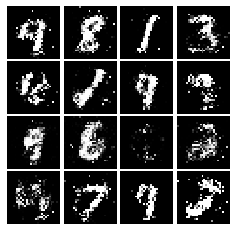

Epoch: 7, Iter: 3580, D: 0.2111, G:0.1708


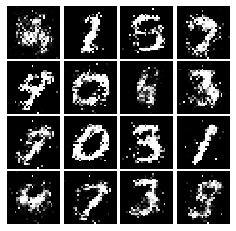

Epoch: 7, Iter: 3600, D: 0.2095, G:0.1661


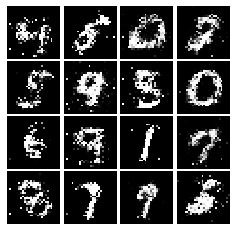

Epoch: 7, Iter: 3620, D: 0.2168, G:0.1789


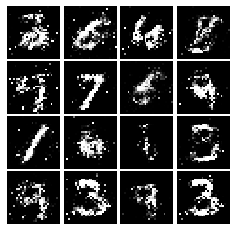

Epoch: 7, Iter: 3640, D: 0.2248, G:0.1848


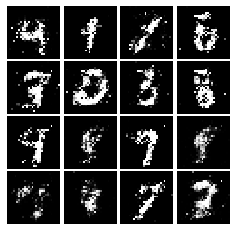

Epoch: 7, Iter: 3660, D: 0.1969, G:0.1859


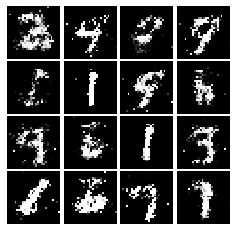

Epoch: 7, Iter: 3680, D: 0.2213, G:0.2061


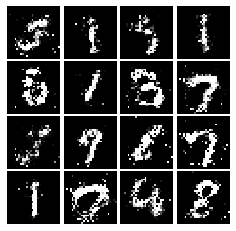

Epoch: 7, Iter: 3700, D: 0.2155, G:0.1847


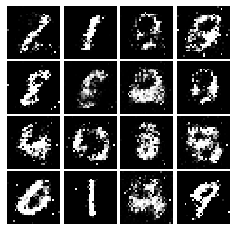

Epoch: 7, Iter: 3720, D: 0.2425, G:0.1813


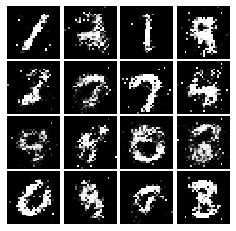

Epoch: 7, Iter: 3740, D: 0.2773, G:0.1511


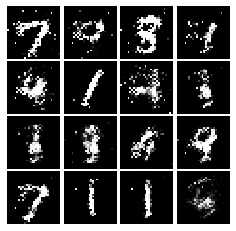

Epoch: 8, Iter: 3760, D: 0.2372, G:0.1714


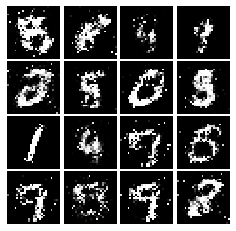

Epoch: 8, Iter: 3780, D: 0.2341, G:0.1799


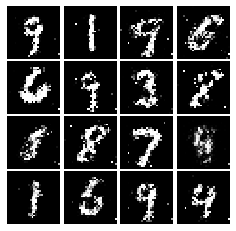

Epoch: 8, Iter: 3800, D: 0.2255, G:0.1552


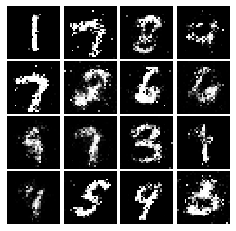

Epoch: 8, Iter: 3820, D: 0.2334, G:0.1771


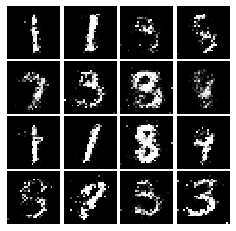

Epoch: 8, Iter: 3840, D: 0.2261, G:0.1594


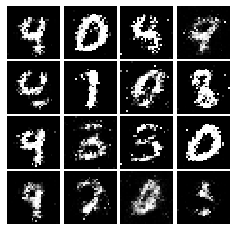

Epoch: 8, Iter: 3860, D: 0.2257, G:0.1756


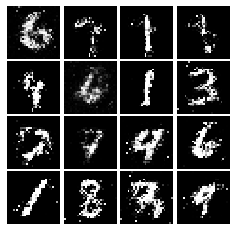

Epoch: 8, Iter: 3880, D: 0.2258, G:0.1701


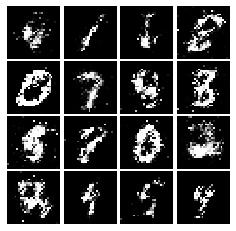

Epoch: 8, Iter: 3900, D: 0.2415, G:0.1638


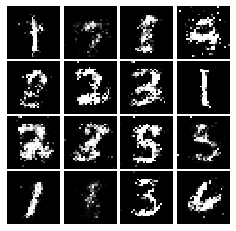

Epoch: 8, Iter: 3920, D: 0.208, G:0.1799


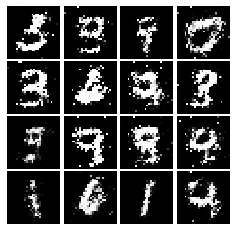

Epoch: 8, Iter: 3940, D: 0.2288, G:0.1586


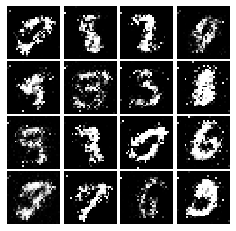

Epoch: 8, Iter: 3960, D: 0.235, G:0.1415


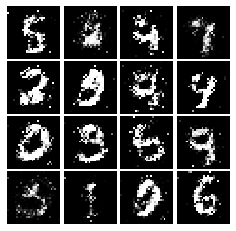

Epoch: 8, Iter: 3980, D: 0.2126, G:0.1839


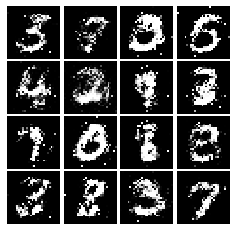

Epoch: 8, Iter: 4000, D: 0.2244, G:0.1796


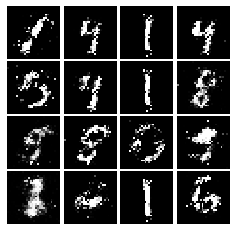

Epoch: 8, Iter: 4020, D: 0.2433, G:0.1389


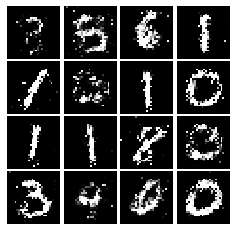

Epoch: 8, Iter: 4040, D: 0.2277, G:0.1711


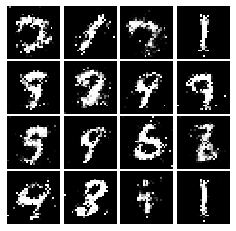

Epoch: 8, Iter: 4060, D: 0.2188, G:0.1891


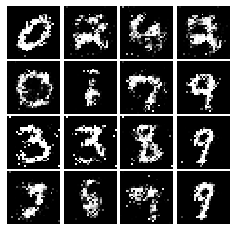

Epoch: 8, Iter: 4080, D: 0.2385, G:0.1508


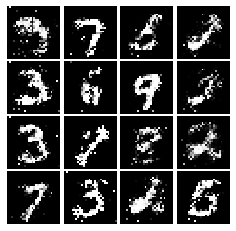

Epoch: 8, Iter: 4100, D: 0.2241, G:0.1557


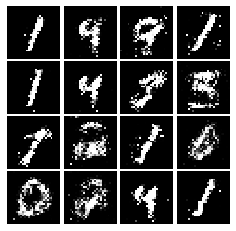

Epoch: 8, Iter: 4120, D: 0.2225, G:0.177


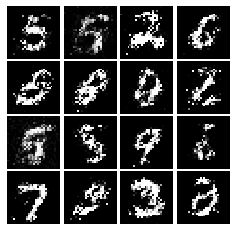

Epoch: 8, Iter: 4140, D: 0.2276, G:0.2093


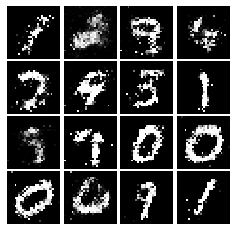

Epoch: 8, Iter: 4160, D: 0.2134, G:0.1838


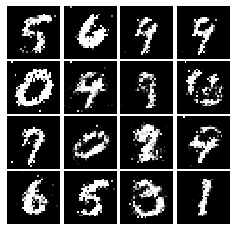

Epoch: 8, Iter: 4180, D: 0.2334, G:0.1721


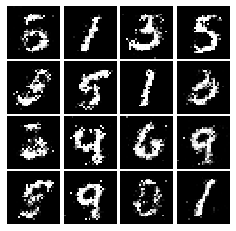

Epoch: 8, Iter: 4200, D: 0.233, G:0.1545


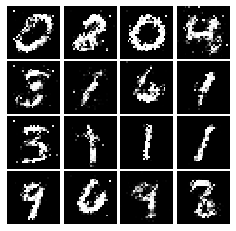

Epoch: 8, Iter: 4220, D: 0.2275, G:0.1912


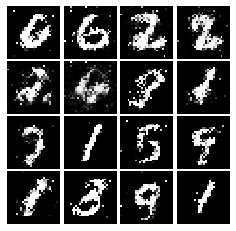

Epoch: 9, Iter: 4240, D: 0.2374, G:0.1771


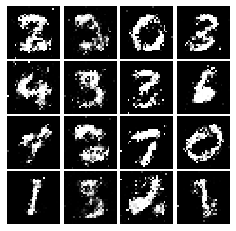

Epoch: 9, Iter: 4260, D: 0.2477, G:0.1619


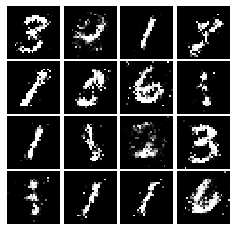

Epoch: 9, Iter: 4280, D: 0.2467, G:0.1811


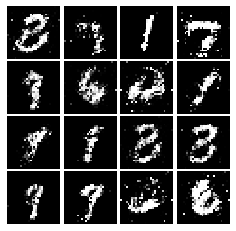

Epoch: 9, Iter: 4300, D: 0.2308, G:0.1611


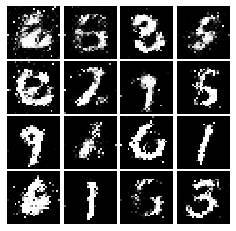

Epoch: 9, Iter: 4320, D: 0.2373, G:0.1823


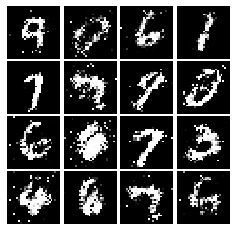

Epoch: 9, Iter: 4340, D: 0.2242, G:0.1608


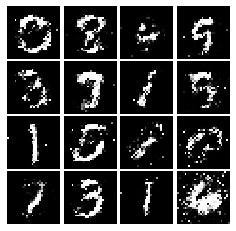

Epoch: 9, Iter: 4360, D: 0.2444, G:0.1489


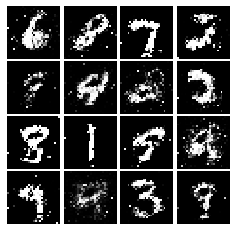

Epoch: 9, Iter: 4380, D: 0.239, G:0.168


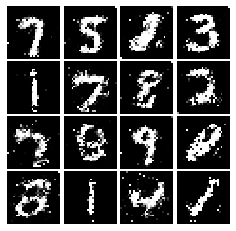

Epoch: 9, Iter: 4400, D: 0.1978, G:0.184


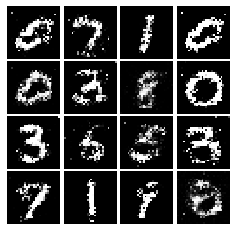

Epoch: 9, Iter: 4420, D: 0.233, G:0.1613


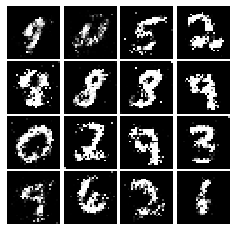

Epoch: 9, Iter: 4440, D: 0.2428, G:0.1515


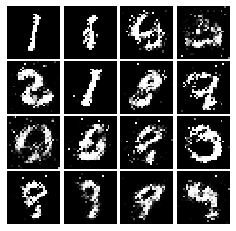

Epoch: 9, Iter: 4460, D: 0.2375, G:0.1638


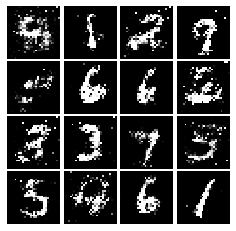

Epoch: 9, Iter: 4480, D: 0.2338, G:0.1816


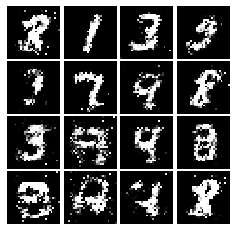

Epoch: 9, Iter: 4500, D: 0.2313, G:0.1573


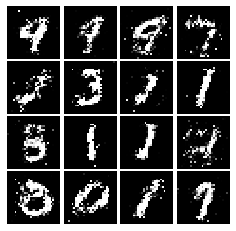

Epoch: 9, Iter: 4520, D: 0.2117, G:0.1846


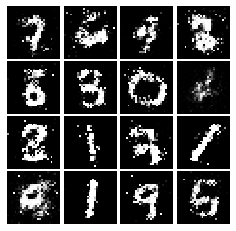

Epoch: 9, Iter: 4540, D: 0.23, G:0.1834


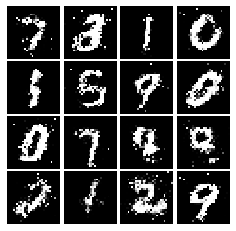

Epoch: 9, Iter: 4560, D: 0.2522, G:0.1559


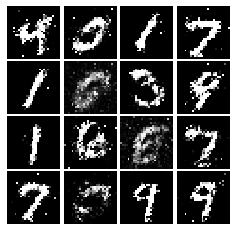

Epoch: 9, Iter: 4580, D: 0.2458, G:0.1552


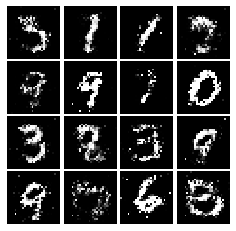

Epoch: 9, Iter: 4600, D: 0.2212, G:0.1661


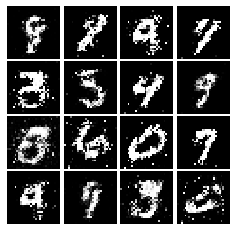

Epoch: 9, Iter: 4620, D: 0.2428, G:0.1666


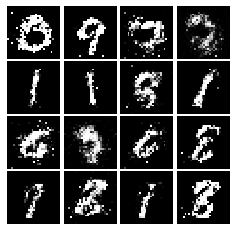

Epoch: 9, Iter: 4640, D: 0.2405, G:0.1616


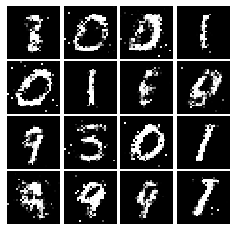

Epoch: 9, Iter: 4660, D: 0.2176, G:0.1855


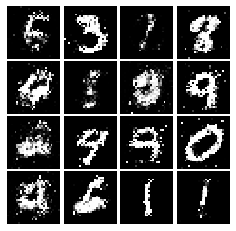

Epoch: 9, Iter: 4680, D: 0.2102, G:0.167


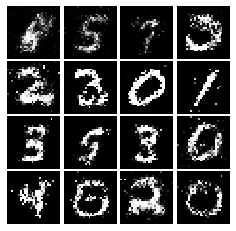

Final images


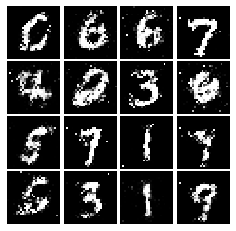

In [31]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [32]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Reshape([28, 28, 1], input_shape =(784,)),
        tf.keras.layers.Conv2D(kernel_size = (5,5), filters = 32, 
                               activation = tf.keras.layers.LeakyReLU(alpha=0.01), 
                               strides = 1, padding = 'VALID'),
        tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = 2),
        tf.keras.layers.Conv2D(kernel_size = (5,5), filters = 64, 
                               activation = tf.keras.layers.LeakyReLU(alpha=0.01),
                               strides = 1, padding = 'VALID'),
        tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = 2),
        tf.keras.layers.Flatten(),    
        tf.keras.layers.Dense(1024, use_bias=True,  activation = tf.keras.layers.LeakyReLU(alpha=0.01)),    
        tf.keras.layers.Dense(1, use_bias=True, activation='linear')

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [43]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    BN_layer1, BN_layer2, BN_layer3 = ( tf.keras.layers.BatchNormalization(),
                                       tf.keras.layers.BatchNormalization(), 
                                       tf.keras.layers.BatchNormalization() )
    BN_layer1.training, BN_layer2.training, BN_layer3.training = True, True, True
    fc1 = tf.keras.layers.Dense(1024, use_bias=True,  activation = 'relu', input_shape =(noise_dim,) )
    fc2 = tf.keras.layers.Dense(6272, use_bias=True,  activation = 'relu' )
    conv2dt1 = tf.keras.layers.Conv2DTranspose(kernel_size = (4,4), filters = 64,
                                               activation = 'relu', padding = 'SAME',
                                               strides = 2, use_bias=True)
    conv2dt2 = tf.keras.layers.Conv2DTranspose(kernel_size = (4,4), filters = 1,
                                                 activation = 'tanh', padding = 'same',
                                                 strides = 2, use_bias=True)
    
    
    
        
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    model.add(fc1)
    model.add(BN_layer1), 
    model.add(fc2),
    model.add(BN_layer2),
    model.add(tf.keras.layers.Reshape((7,7,128))),
    model.add(conv2dt1),
    model.add(BN_layer3),
    model.add(conv2dt2),

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.42, G:0.6564


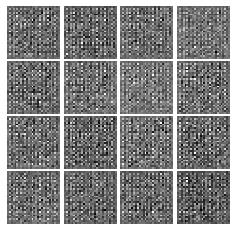

Epoch: 0, Iter: 20, D: 0.5622, G:2.386


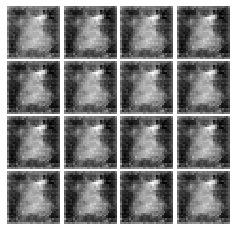

Epoch: 0, Iter: 40, D: 2.046, G:0.9272


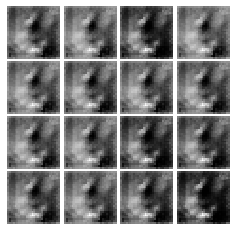

Epoch: 0, Iter: 60, D: 0.5599, G:1.953


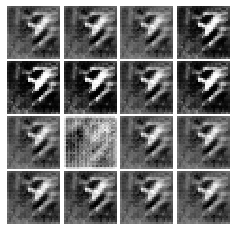

Epoch: 0, Iter: 80, D: 0.4829, G:3.216


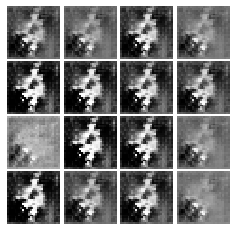

Epoch: 0, Iter: 100, D: 0.172, G:3.676


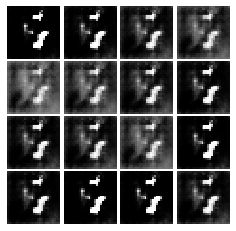

Epoch: 0, Iter: 120, D: 0.4671, G:3.096


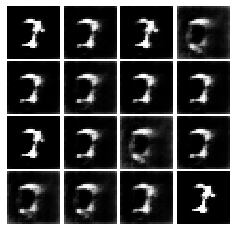

Epoch: 0, Iter: 140, D: 0.8337, G:5.72


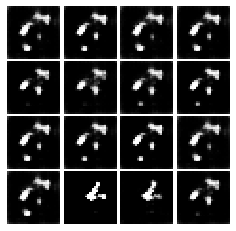

Epoch: 0, Iter: 160, D: 0.7305, G:3.575


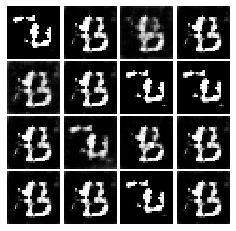

Epoch: 0, Iter: 180, D: 0.7436, G:2.106


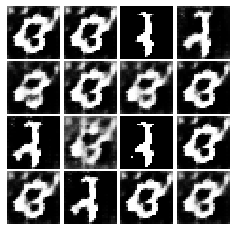

Epoch: 0, Iter: 200, D: 0.923, G:2.684


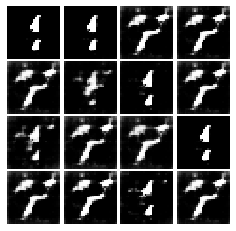

Epoch: 0, Iter: 220, D: 0.4922, G:3.71


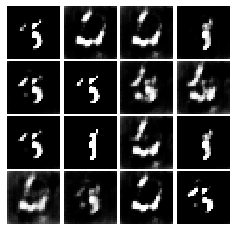

Epoch: 0, Iter: 240, D: 0.8799, G:2.618


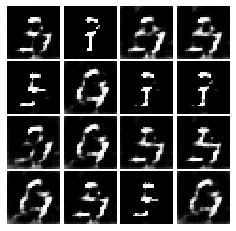

Epoch: 0, Iter: 260, D: 0.7977, G:2.518


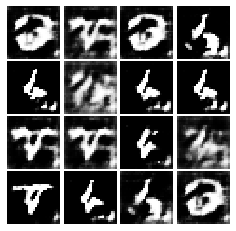

Epoch: 0, Iter: 280, D: 0.5446, G:2.213


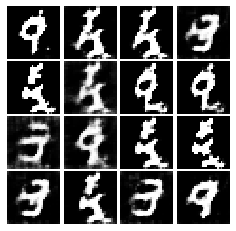

Epoch: 0, Iter: 300, D: 0.5131, G:3.001


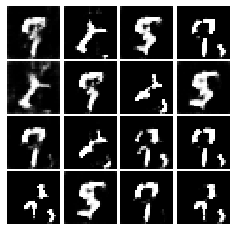

Epoch: 0, Iter: 320, D: 0.9277, G:1.698


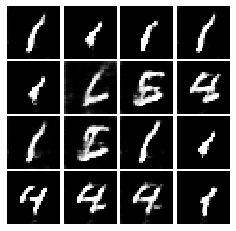

Epoch: 0, Iter: 340, D: 0.3492, G:2.751


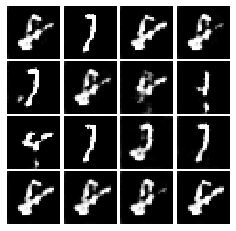

Epoch: 0, Iter: 360, D: 0.7698, G:1.655


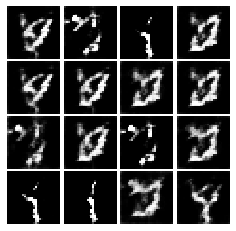

Epoch: 0, Iter: 380, D: 0.5849, G:1.883


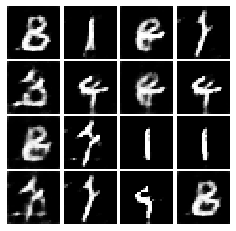

Epoch: 0, Iter: 400, D: 0.3797, G:3.296


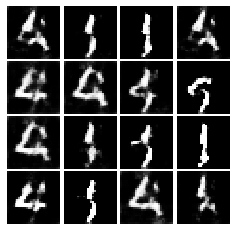

Epoch: 0, Iter: 420, D: 0.6031, G:2.183


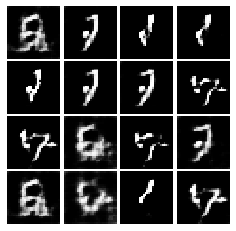

Epoch: 0, Iter: 440, D: 0.4123, G:3.032


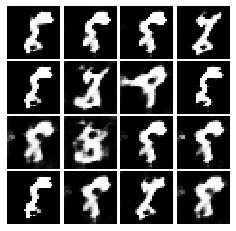

Epoch: 0, Iter: 460, D: 2.168, G:3.475


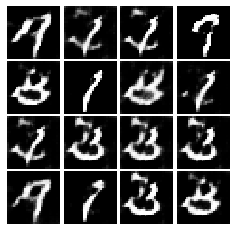

Epoch: 1, Iter: 480, D: 0.5113, G:2.635


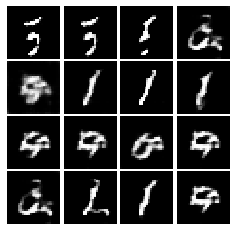

Epoch: 1, Iter: 500, D: 0.4643, G:3.206


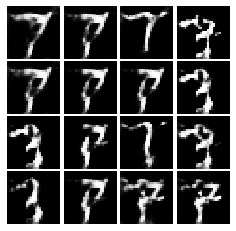

Epoch: 1, Iter: 520, D: 0.5274, G:2.527


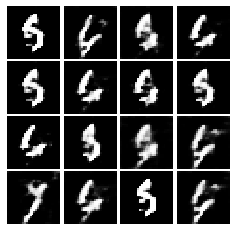

Epoch: 1, Iter: 540, D: 0.5016, G:2.833


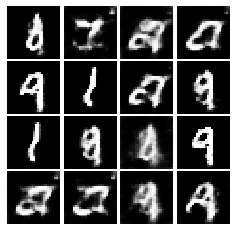

Epoch: 1, Iter: 560, D: 0.7526, G:5.977


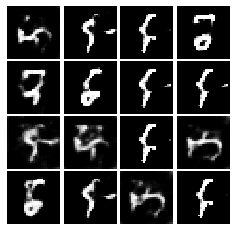

Epoch: 1, Iter: 580, D: 0.4074, G:2.767


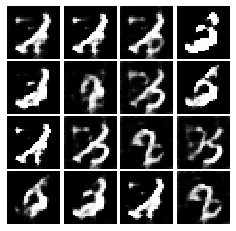

Epoch: 1, Iter: 600, D: 0.5353, G:1.466


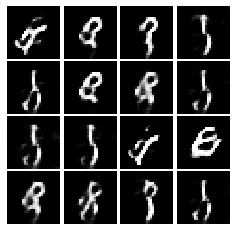

Epoch: 1, Iter: 620, D: 0.5265, G:2.174


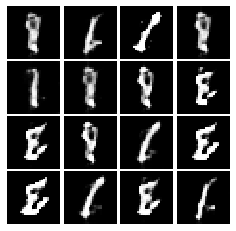

Epoch: 1, Iter: 640, D: 0.6512, G:3.216


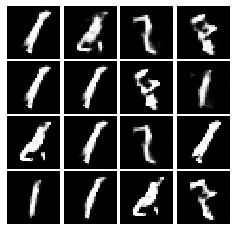

Epoch: 1, Iter: 660, D: 0.4077, G:2.703


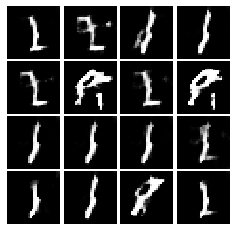

Epoch: 1, Iter: 680, D: 0.87, G:1.32


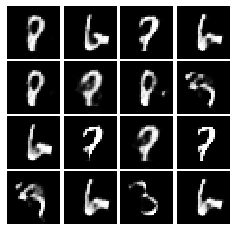

Epoch: 1, Iter: 700, D: 0.4298, G:4.081


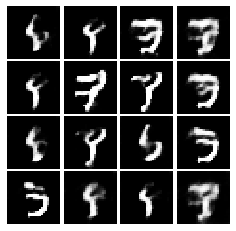

Epoch: 1, Iter: 720, D: 1.123, G:4.122


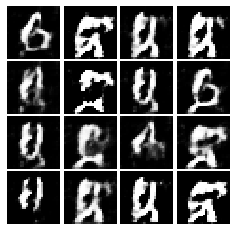

Epoch: 1, Iter: 740, D: 0.8016, G:4.258


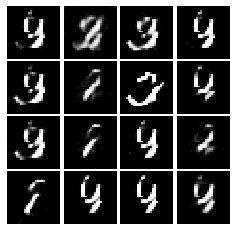

Epoch: 1, Iter: 760, D: 0.5606, G:3.615


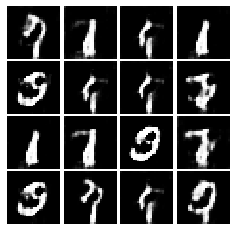

Epoch: 1, Iter: 780, D: 0.258, G:3.477


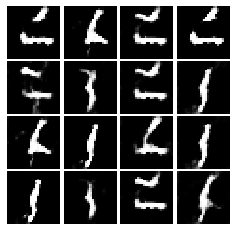

Epoch: 1, Iter: 800, D: 0.1923, G:4.094


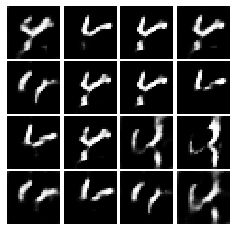

Epoch: 1, Iter: 820, D: 0.536, G:2.775


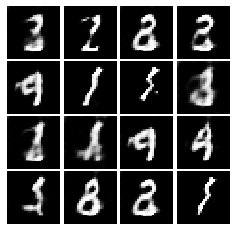

Epoch: 1, Iter: 840, D: 0.3126, G:3.663


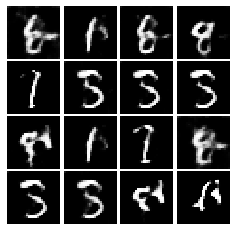

Epoch: 1, Iter: 860, D: 0.5929, G:4.607


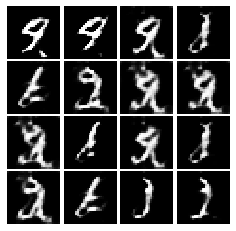

Epoch: 1, Iter: 880, D: 0.3415, G:2.862


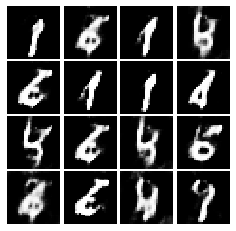

Epoch: 1, Iter: 900, D: 0.3864, G:3.276


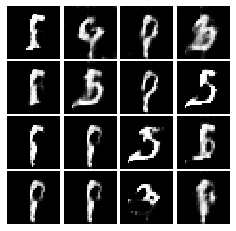

Epoch: 1, Iter: 920, D: 0.2196, G:3.886


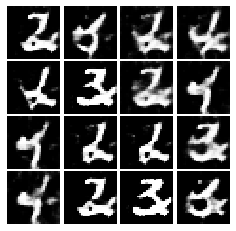

Epoch: 2, Iter: 940, D: 0.4116, G:3.062


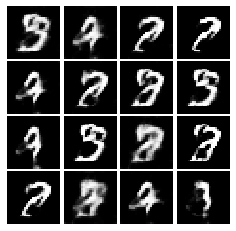

Epoch: 2, Iter: 960, D: 0.6184, G:2.953


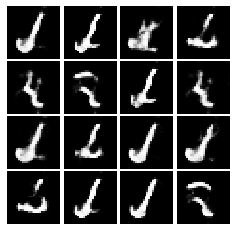

Epoch: 2, Iter: 980, D: 0.6225, G:3.058


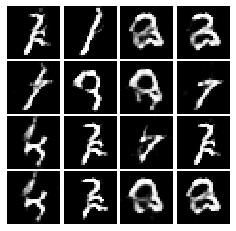

Epoch: 2, Iter: 1000, D: 0.6797, G:2.361


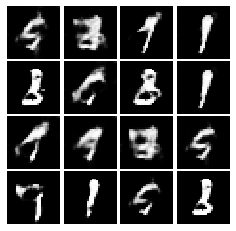

Epoch: 2, Iter: 1020, D: 0.5323, G:3.281


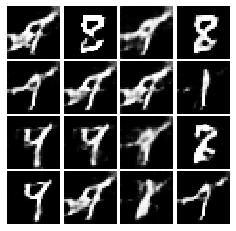

Epoch: 2, Iter: 1040, D: 0.7697, G:4.835


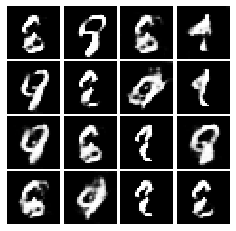

Epoch: 2, Iter: 1060, D: 0.2344, G:3.801


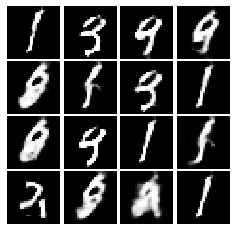

Epoch: 2, Iter: 1080, D: 0.6101, G:2.64


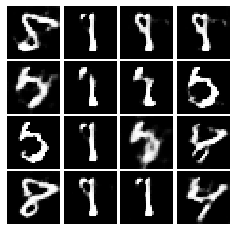

Epoch: 2, Iter: 1100, D: 0.6059, G:1.906


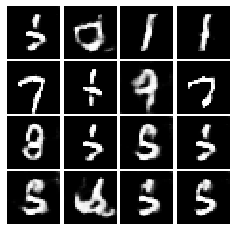

Epoch: 2, Iter: 1120, D: 0.6745, G:3.611


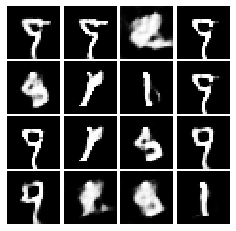

Epoch: 2, Iter: 1140, D: 0.518, G:3.144


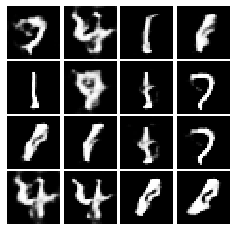

Epoch: 2, Iter: 1160, D: 0.3505, G:2.631


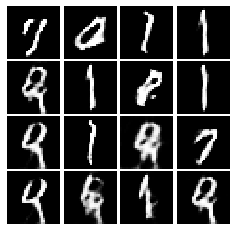

Epoch: 2, Iter: 1180, D: 0.2974, G:2.601


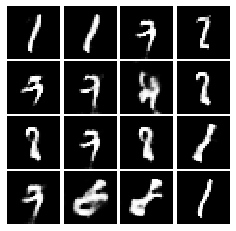

Epoch: 2, Iter: 1200, D: 0.4574, G:2.191


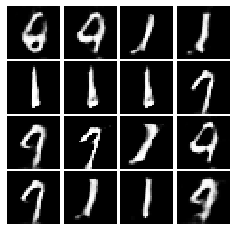

Epoch: 2, Iter: 1220, D: 0.5448, G:3.537


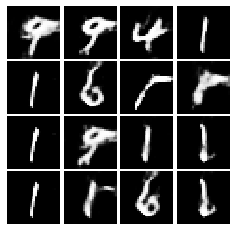

Epoch: 2, Iter: 1240, D: 0.4391, G:2.546


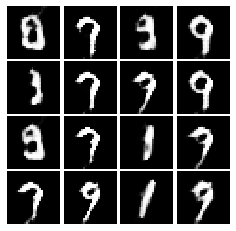

Epoch: 2, Iter: 1260, D: 0.7115, G:2.974


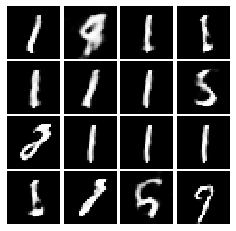

Epoch: 2, Iter: 1280, D: 0.5294, G:2.305


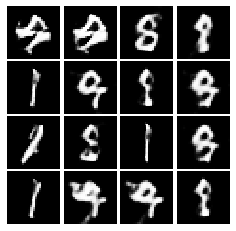

Epoch: 2, Iter: 1300, D: 0.4619, G:2.929


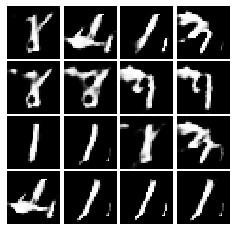

Epoch: 2, Iter: 1320, D: 0.516, G:2.198


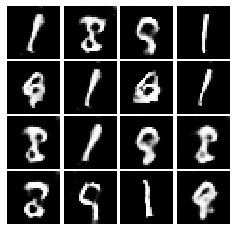

Epoch: 2, Iter: 1340, D: 0.5048, G:2.829


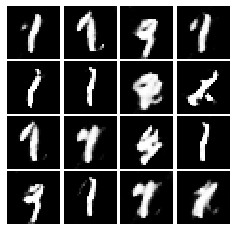

Epoch: 2, Iter: 1360, D: 0.4093, G:2.997


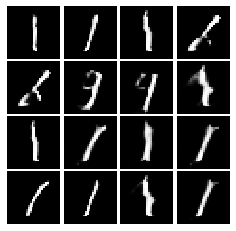

Epoch: 2, Iter: 1380, D: 0.3887, G:2.311


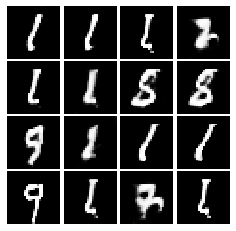

Epoch: 2, Iter: 1400, D: 0.4102, G:2.393


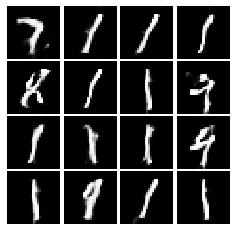

Epoch: 3, Iter: 1420, D: 0.5352, G:2.552


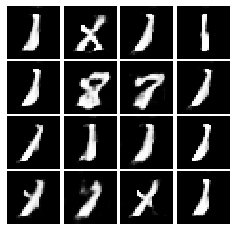

Epoch: 3, Iter: 1440, D: 0.4832, G:3.941


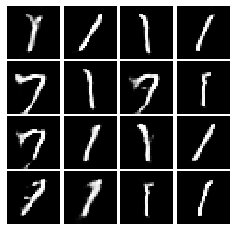

Epoch: 3, Iter: 1460, D: 0.4274, G:2.2


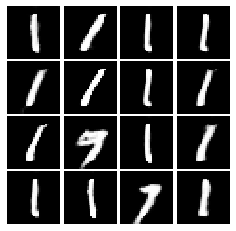

Epoch: 3, Iter: 1480, D: 0.5045, G:2.414


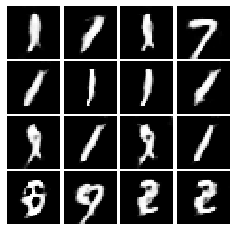

Epoch: 3, Iter: 1500, D: 0.518, G:2.06


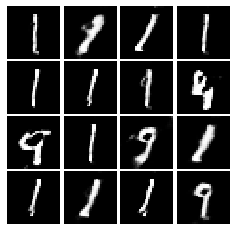

Epoch: 3, Iter: 1520, D: 0.545, G:3.174


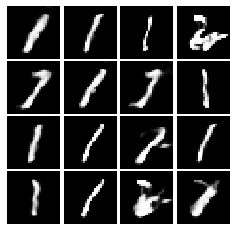

Epoch: 3, Iter: 1540, D: 0.5767, G:2.383


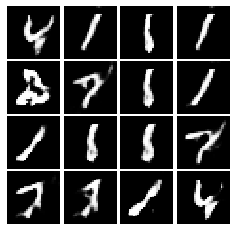

Epoch: 3, Iter: 1560, D: 0.5002, G:2.182


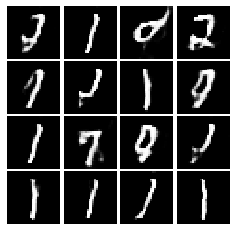

Epoch: 3, Iter: 1580, D: 0.5321, G:2.831


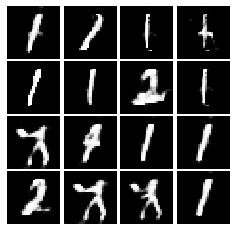

Epoch: 3, Iter: 1600, D: 0.7853, G:3.812


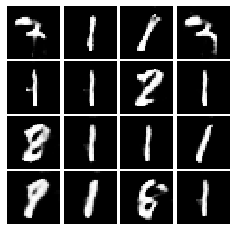

Epoch: 3, Iter: 1620, D: 0.4331, G:2.381


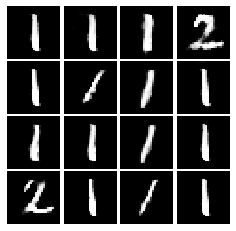

Epoch: 3, Iter: 1640, D: 0.5835, G:2.178


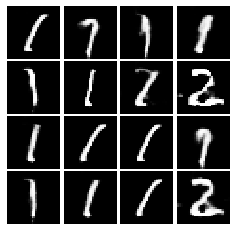

Epoch: 3, Iter: 1660, D: 0.4265, G:2.613


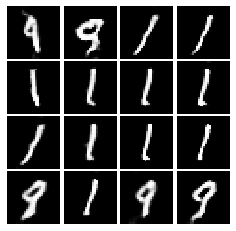

Epoch: 3, Iter: 1680, D: 0.434, G:2.678


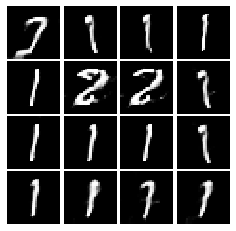

Epoch: 3, Iter: 1700, D: 0.3623, G:2.633


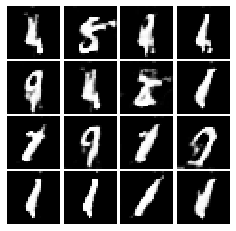

Epoch: 3, Iter: 1720, D: 0.6278, G:4.325


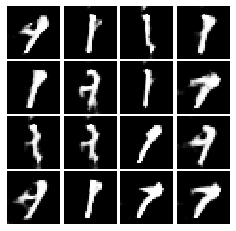

Epoch: 3, Iter: 1740, D: 0.4673, G:2.124


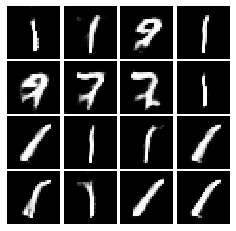

Epoch: 3, Iter: 1760, D: 0.3911, G:2.878


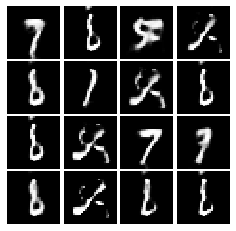

Epoch: 3, Iter: 1780, D: 0.5336, G:2.343


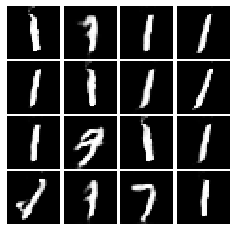

Epoch: 3, Iter: 1800, D: 0.5486, G:2.361


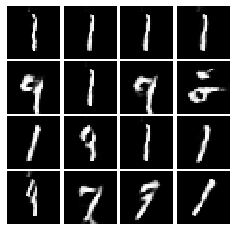

Epoch: 3, Iter: 1820, D: 0.6162, G:2.616


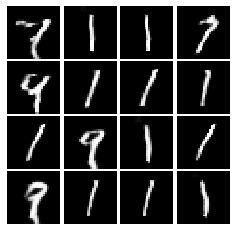

Epoch: 3, Iter: 1840, D: 0.5317, G:2.387


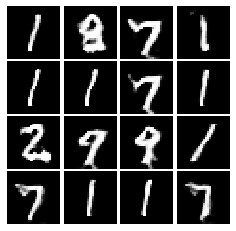

Epoch: 3, Iter: 1860, D: 0.5547, G:1.824


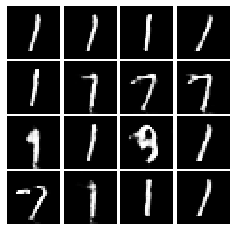

Epoch: 4, Iter: 1880, D: 0.3588, G:2.579


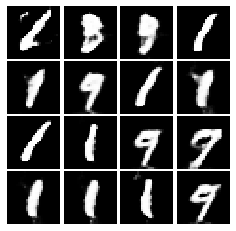

Epoch: 4, Iter: 1900, D: 0.4572, G:2.03


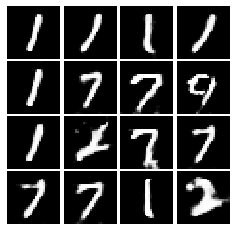

Epoch: 4, Iter: 1920, D: 0.4629, G:2.274


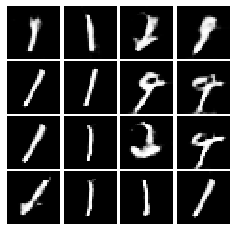

Epoch: 4, Iter: 1940, D: 0.4142, G:2.892


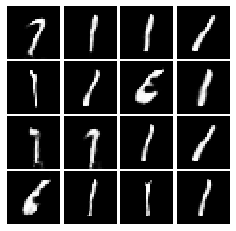

Epoch: 4, Iter: 1960, D: 0.4601, G:1.981


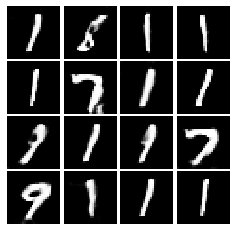

Epoch: 4, Iter: 1980, D: 0.4977, G:2.222


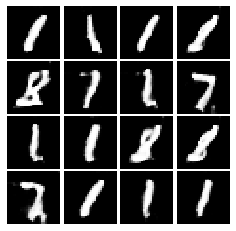

Epoch: 4, Iter: 2000, D: 0.7558, G:1.555


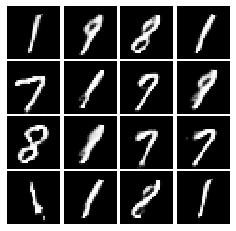

Epoch: 4, Iter: 2020, D: 0.5015, G:2.218


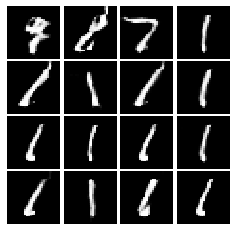

Epoch: 4, Iter: 2040, D: 0.4918, G:2.78


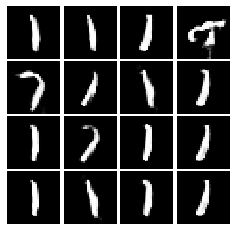

Epoch: 4, Iter: 2060, D: 0.4223, G:2.15


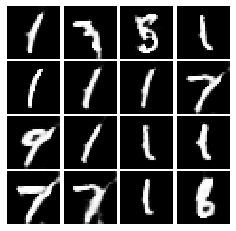

Epoch: 4, Iter: 2080, D: 0.5265, G:2.212


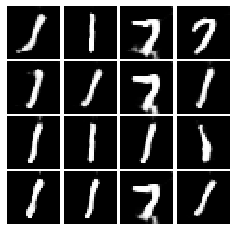

Epoch: 4, Iter: 2100, D: 0.5366, G:2.294


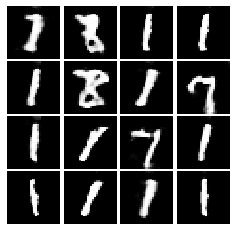

Epoch: 4, Iter: 2120, D: 0.5204, G:1.631


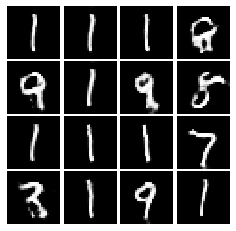

Epoch: 4, Iter: 2140, D: 0.6658, G:1.591


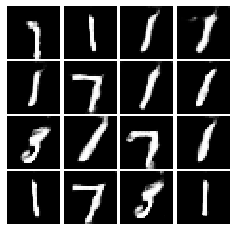

Epoch: 4, Iter: 2160, D: 0.59, G:2.387


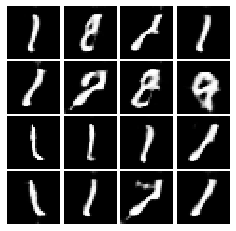

Epoch: 4, Iter: 2180, D: 0.5526, G:2.081


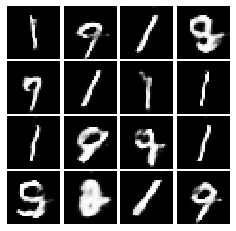

Epoch: 4, Iter: 2200, D: 0.5271, G:1.861


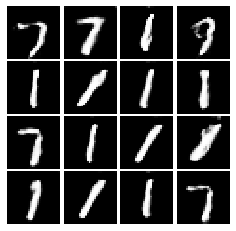

Epoch: 4, Iter: 2220, D: 0.4829, G:2.223


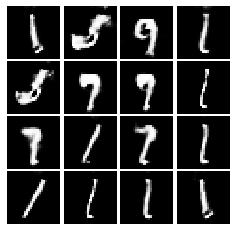

Epoch: 4, Iter: 2240, D: 0.5871, G:1.888


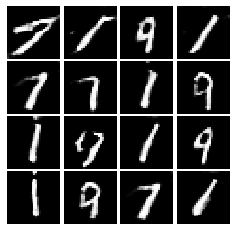

Epoch: 4, Iter: 2260, D: 0.5298, G:2.334


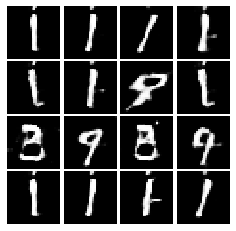

Epoch: 4, Iter: 2280, D: 0.5489, G:2.092


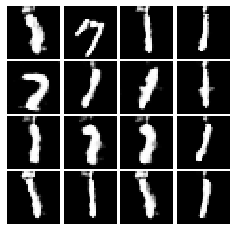

Epoch: 4, Iter: 2300, D: 0.5754, G:2.528


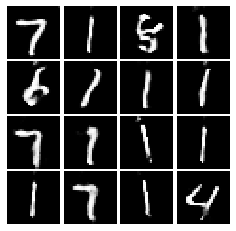

Epoch: 4, Iter: 2320, D: 0.5231, G:1.957


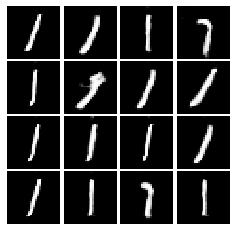

Epoch: 4, Iter: 2340, D: 0.9389, G:3.975


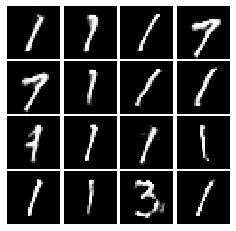

Final images


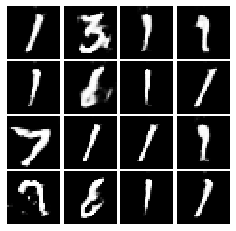

In [44]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)